# Validações Estatísticas do BeamNG como Digital Twin — v8

Estrutura de comparação:
```
simulado_1 × real_1
simulado_1 × real_2
simulado_1 × real_3
─────────────────────
simulado_2 × real_1
simulado_2 × real_2
simulado_2 × real_3
...
```
Métricas por par: **Pearson · DTW · RMSE · MAE · Atraso temporal ·
Coerência espectral · PSD · FFT · Fréchet Distance**

Ao final: heatmaps e tabela comparando todos os pares.


## 1. Imports

In [8]:
try:
    from dtaidistance import dtw, dtw_ndim
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'dtaidistance', '-q'])
    from dtaidistance import dtw, dtw_ndim

try:
    import similaritymeasures
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'similaritymeasures', '-q'])
    import similaritymeasures

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats      import pearsonr, f_oneway
from scipy.signal     import correlate, detrend, welch, coherence, butter, filtfilt
from scipy.fft        import fft, fftfreq
from scipy.spatial.distance import directed_hausdorff
from sklearn.preprocessing  import MinMaxScaler
from sklearn.metrics        import mean_squared_error, mean_absolute_error
from IPython.display        import display
from os      import listdir
from os.path import join
import ast, warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.dpi': 120,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.alpha': 0.3,
})
print('OK')


OK


## 2. Configuração

In [9]:
# ─── AJUSTE AQUI ─────────────────────────────────────────────────────────────
PASTA_REAL     = 'circuito4/real'
PASTA_SIMULADO = 'circuito4/simulado_taxa_coleta_correta'
N_SEGMENTOS    = 10
COLUNAS_CORR   = ['posX', 'posY', 'posZ', 'vel']
# ─────────────────────────────────────────────────────────────────────────────

arquivos_real = sorted(listdir(PASTA_REAL))
arquivos_sim  = sorted(listdir(PASTA_SIMULADO))

print(f'Reais:      {len(arquivos_real)} arquivos')
for f in arquivos_real:
    print(f'  {f}')
print(f'\nSimulados:  {len(arquivos_sim)} arquivos')
for f in arquivos_sim:
    print(f'  {f}')
print(f'\nTotal de combinações: {len(arquivos_sim)} × {len(arquivos_real)} = {len(arquivos_sim)*len(arquivos_real)}')

Reais:      10 arquivos
  1.csv
  10.csv
  2.csv
  3.csv
  4.csv
  5.csv
  6.csv
  7.csv
  8.csv
  9.csv

Simulados:  1 arquivos
  readable.csv

Total de combinações: 1 × 10 = 10


## 3. Funções de preparação e análise

In [10]:
# ─────────────────────────────────────────────────────────────────────────────
# Funções de preparação (originais, sem alteração)
# ─────────────────────────────────────────────────────────────────────────────

def latlon_para_metros(lat, lon):
    R = 6_371_000.0
    lat0, lon0 = np.radians(lat[0]), np.radians(lon[0])
    x = R * (np.radians(lon) - lon0) * np.cos(lat0)
    y = R * (np.radians(lat) - lat0)
    return x, y

def parse_vel(s):
    try:
        v = ast.literal_eval(str(s))
        return float(np.linalg.norm(v))
    except Exception:
        return np.nan

def preparar_real(df, freq='100ms'):
    df = df.copy()
    df.columns = df.columns.str.strip()
    df = df.sort_values('Time (sec)').reset_index(drop=True)
    df['time'] = pd.to_timedelta(df['Time (sec)'], unit='s')
    df = df.set_index('time')
    df = df.apply(pd.to_numeric, errors='coerce').dropna(axis=1, how='all')
    x_m, y_m = latlon_para_metros(df['Latitude (deg)'].values, df['Longitude (deg)'].values)
    df['posX'] = x_m
    df['posY'] = y_m
    df['posZ'] = detrend(df['Altitude (m)'].values, type='linear')
    df = df.rename(columns={'Posição D do pedal do acelerador (%)': 'throttle'})
    if 'Velocidade do veículo (km/h)' in df.columns:
        df['vel'] = df['Velocidade do veículo (km/h)'] / 3.6
    elif 'Velocidade do GPS (km/h)' in df.columns:
        df['vel'] = df['Velocidade do GPS (km/h)'] / 3.6
    df = df.resample(freq).mean().interpolate(method='time')
    df.index = df.index - df.index[0]
    return df

def preparar_simulado(df, freq='100ms'):
    df = df.copy()
    df.columns = df.columns.str.strip()
    df = df.rename(columns={df.columns[0]: 'time'})
    df = df.sort_values('time').reset_index(drop=True)
    df['time'] = pd.to_timedelta(df['time'] - df['time'].iloc[0], unit='s')
    df = df.set_index('time')
    if 'vel' in df.columns:
        df['vel'] = df['vel'].apply(parse_vel)
    df = df.apply(pd.to_numeric, errors='coerce').dropna(axis=1, how='all')
    if 'posZ' in df.columns:
        df['posZ'] = detrend(df['posZ'].values, type='linear')
    df = df.resample(freq).mean().interpolate(method='time')
    if 'vel' in df.columns:
        df['vel'] = df['vel'].rolling(window=10, center=True, min_periods=1).mean()
    df.index = df.index - df.index[0]
    return df

def alinhar_e_normalizar(real, simulado, colunas):
    duracao_min = min(real.index[-1], simulado.index[-1])
    real_c = real.loc[:duracao_min, colunas]
    sim_c  = simulado.loc[:duracao_min, colunas]
    real_n = pd.DataFrame(MinMaxScaler().fit_transform(real_c), index=real_c.index, columns=colunas)
    sim_n  = pd.DataFrame(MinMaxScaler().fit_transform(sim_c),  index=sim_c.index,  columns=colunas)
    df = pd.concat([real_n.add_prefix('real_'), sim_n.add_prefix('sim_')], axis=1, join='inner').dropna()
    lags = {'posZ': 0, 'vel': 0}
    for col in ['posX', 'posY']:
        if col not in colunas:
            continue
        x = df[f'real_{col}'].values
        y = df[f'sim_{col}'].values
        corr = correlate(x - x.mean(), y - y.mean(), mode='full')
        nd   = np.std(x) * np.std(y) * len(x)
        corr = corr / nd if nd > 0 else corr
        lags[col] = int(np.arange(-(len(x)-1), len(x))[np.argmax(corr)])
    for col, lag in lags.items():
        if col in colunas:
            df[f'sim_{col}_shifted'] = df[f'sim_{col}'].shift(lag)
    return df.dropna(), lags, real_c, sim_c

def calcular_metricas(df, colunas, n_seg):
    resultado = {}
    n = len(df)
    seg_size = max(1, n // n_seg)
    t_seg = df.index.total_seconds().values
    for col in colunas:
        x  = df[f'real_{col}'].values
        ys = df[f'sim_{col}_shifted'].values
        r, p_r = pearsonr(x, ys)
        dist = dtw.distance_fast(x.astype(np.double), ys.astype(np.double), use_pruning=True)
        sim  = 1.0 / (1.0 + dist / n)
        segs = []
        for i in range(n_seg):
            ini = i * seg_size
            fim = ini + seg_size if i < n_seg - 1 else n
            xi, yi = x[ini:fim], ys[ini:fim]
            F, pv = (0.0, 1.0) if (np.std(xi) < 1e-10 and np.std(yi) < 1e-10) else f_oneway(xi, yi)
            segs.append({'ini': t_seg[ini], 'fim': t_seg[min(fim-1, n-1)], 'F': F, 'p': pv})
        pct_dif = sum(1 for s in segs if s['p'] < 0.05) / n_seg * 100
        resultado[col] = {
            'pearson_r': r, 'pearson_p': p_r,
            'dtw_sim': sim, 'dtw_dist': dist,
            'anova_segs': segs, 'anova_pct_dif': pct_dif
        }
    return resultado

def veredicto(r, sim, pct):
    if r > 0.85 and sim > 0.85 and pct <= 20:  return '✓ Válido'
    elif r > 0.70 and sim > 0.70 and pct <= 50: return '~ Aceitável'
    else:                                        return '✗ Divergente'


# ─────────────────────────────────────────────────────────────────────────────
# Funções de métricas avançadas (NOVAS — v8)
# ─────────────────────────────────────────────────────────────────────────────

FS = 10  # frequência de amostragem em Hz (100 ms → 10 Hz)

# ── Temporais ─────────────────────────────────────────────────────────────────

def calcular_rmse(a, b):
    """RMSE entre dois arrays de mesmo tamanho."""
    return float(np.sqrt(mean_squared_error(a, b)))

def calcular_mae(a, b):
    """MAE entre dois arrays de mesmo tamanho."""
    return float(mean_absolute_error(a, b))

# ── Atraso temporal ───────────────────────────────────────────────────────────

def calcular_atraso(x, y, fs=FS):
    """
    Cross-correlação normalizada para estimar o atraso de y em relação a x.

    Retorna
    -------
    lag_amostras : int   – deslocamento ótimo em amostras
    lag_segundos : float – deslocamento em segundos
    corr_max     : float – correlação no pico (−1 a 1)
    lags_s       : array – eixo de lags em segundos (para plotar)
    corr_full    : array – curva completa de correlação (para plotar)
    """
    x = np.array(x, dtype=float)
    y = np.array(y, dtype=float)
    xc = (x - x.mean()) / (x.std() + 1e-10)
    yc = (y - y.mean()) / (y.std() + 1e-10)
    corr_full = correlate(xc, yc, mode='full') / len(x)
    lags_arr  = np.arange(-(len(x) - 1), len(x))
    idx_max   = int(np.argmax(corr_full))
    lag_samp  = int(lags_arr[idx_max])
    lag_seg   = lag_samp / fs
    corr_max  = float(corr_full[idx_max])
    lags_s    = lags_arr / fs
    return lag_samp, lag_seg, corr_max, lags_s, corr_full

# ── Espectrais ────────────────────────────────────────────────────────────────

def calcular_psd(signal, fs=FS):
    """PSD via método de Welch. Retorna (freqs, potências)."""
    return welch(signal, fs=fs)

def calcular_fft(signal, fs=FS):
    """
    FFT unilateral normalizada.
    Retorna (freqs_positivas, amplitudes).
    """
    n  = len(signal)
    yf = fft(np.array(signal, dtype=float))
    xf = fftfreq(n, d=1.0 / fs)
    pos = xf >= 0
    return xf[pos], (2.0 / n) * np.abs(yf[pos])

def calcular_coerencia(x, y, fs=FS):
    """Coerência espectral de Welch (0–1 por frequência)."""
    return coherence(x, y, fs=fs)

def rmse_espectral(x, y, fs=FS):
    """RMSE entre as PSDs de x e y — mede erro na distribuição de energia."""
    _, p1 = calcular_psd(x, fs=fs)
    _, p2 = calcular_psd(y, fs=fs)
    m = min(len(p1), len(p2))
    return float(np.sqrt(np.mean((p1[:m] - p2[:m]) ** 2)))

# ── Espaciais ─────────────────────────────────────────────────────────────────

def hausdorff_distance(x1, y1, x2, y2):
    """Hausdorff distance simétrica entre duas trajetórias XY (metros)."""
    A = np.column_stack((x1, y1))
    B = np.column_stack((x2, y2))
    return max(directed_hausdorff(A, B)[0],
               directed_hausdorff(B, A)[0])

def frechet_distance(x1, y1, x2, y2):
    """
    Fréchet distance discreta entre duas trajetórias XY (metros).
    Sensível à ordem dos pontos — complementa Hausdorff.
    """
    A = np.column_stack((x1, y1))
    B = np.column_stack((x2, y2))
    return float(similaritymeasures.frechet_dist(A, B))

# ── Score híbrido ─────────────────────────────────────────────────────────────

def score_hibrido(pearson, dtw_sim, rmse_norm, coerencia_media,
                  lag_norm=0.0, fft_rmse_norm=0.0, frechet_norm=0.5):
    """
    Score único de fidelidade do Digital Twin (0–1, maior = melhor).

    Pesos:
        Pearson          30 %  tendência global
        DTW              20 %  alinhamento elástico
        RMSE (inv)       15 %  erro quadrático
        Coerência        15 %  fidelidade em frequência
        Atraso (inv)     10 %  penalidade por defasagem
        FFT-RMSE (inv)    5 %  erro espectral
        Fréchet (inv)     5 %  fidelidade espacial
    """
    p = float(np.clip(pearson, 0, 1))
    return float(np.clip(
        0.30 * p +
        0.20 * dtw_sim +
        0.15 * (1 - np.clip(rmse_norm,      0, 1)) +
        0.15 * coerencia_media +
        0.10 * (1 - np.clip(lag_norm,        0, 1)) +
        0.05 * (1 - np.clip(fft_rmse_norm,   0, 1)) +
        0.05 * (1 - np.clip(frechet_norm,    0, 1)),
        0, 1))

def classificar_score(score):
    if score > 0.85: return 'Excelente'
    if score > 0.70: return 'Boa'
    if score > 0.50: return 'Moderada'
    return 'Baixa'

print('OK: funções definidas (v8 — métricas avançadas incluídas)')


OK: funções definidas (v8 — métricas avançadas incluídas)


## 4. Pré-carregar todos os arquivos
Carrega e prepara tudo uma vez só — evita reprocessar o mesmo arquivo várias vezes.

In [11]:
# Cache de arquivos preparados
cache_real = {}
cache_sim  = {}

print('Preparando arquivos reais...')
for f in arquivos_real:
    try:
        df_raw = pd.read_csv(join(PASTA_REAL, f), sep=',', skipinitialspace=True)
        cache_real[f] = preparar_real(df_raw)
        print(f'  ✓ {f}  →  {len(cache_real[f])} amostras | {cache_real[f].index[-1]}')
    except Exception as e:
        print(f'  ✗ {f}  →  ERRO: {e}')

print('\nPreparando arquivos simulados...')
for f in arquivos_sim:
    try:
        df_raw = pd.read_csv(join(PASTA_SIMULADO, f), sep=';')
        cache_sim[f] = preparar_simulado(df_raw)
        print(f'  ✓ {f}  →  {len(cache_sim[f])} amostras | {cache_sim[f].index[-1]}')
    except Exception as e:
        print(f'  ✗ {f}  →  ERRO: {e}')

print(f'\nCache: {len(cache_real)} reais | {len(cache_sim)} simulados prontos')

Preparando arquivos reais...


  ✓ 1.csv  →  4430 amostras | 0 days 00:07:22.900000
  ✓ 10.csv  →  4130 amostras | 0 days 00:06:52.900000
  ✓ 2.csv  →  4362 amostras | 0 days 00:07:16.100000
  ✓ 3.csv  →  4299 amostras | 0 days 00:07:09.800000
  ✓ 4.csv  →  4261 amostras | 0 days 00:07:06
  ✓ 5.csv  →  4260 amostras | 0 days 00:07:05.900000
  ✓ 6.csv  →  4340 amostras | 0 days 00:07:13.900000
  ✓ 7.csv  →  4170 amostras | 0 days 00:06:56.900000
  ✓ 8.csv  →  4210 amostras | 0 days 00:07:00.900000
  ✓ 9.csv  →  4160 amostras | 0 days 00:06:55.900000

Preparando arquivos simulados...
  ✓ readable.csv  →  4505 amostras | 0 days 00:07:30.400000

Cache: 10 reais | 1 simulados prontos


## 5. Loop principal — cada simulado contra todos os reais

Para cada simulado S_i:
- Testa contra R_1, R_2, R_3...
- Gera plots individuais de cada combinação
- Salva métricas para o comparativo final


██████████████████████████████████████████████████████████████████████
SIMULADO: readable.csv
██████████████████████████████████████████████████████████████████████

  ── SIM: readable.csv  ×  REAL: 1.csv
    Amostras: 4402 | Lags: {'posZ': 0, 'vel': 0, 'posX': -26, 'posY': 2}


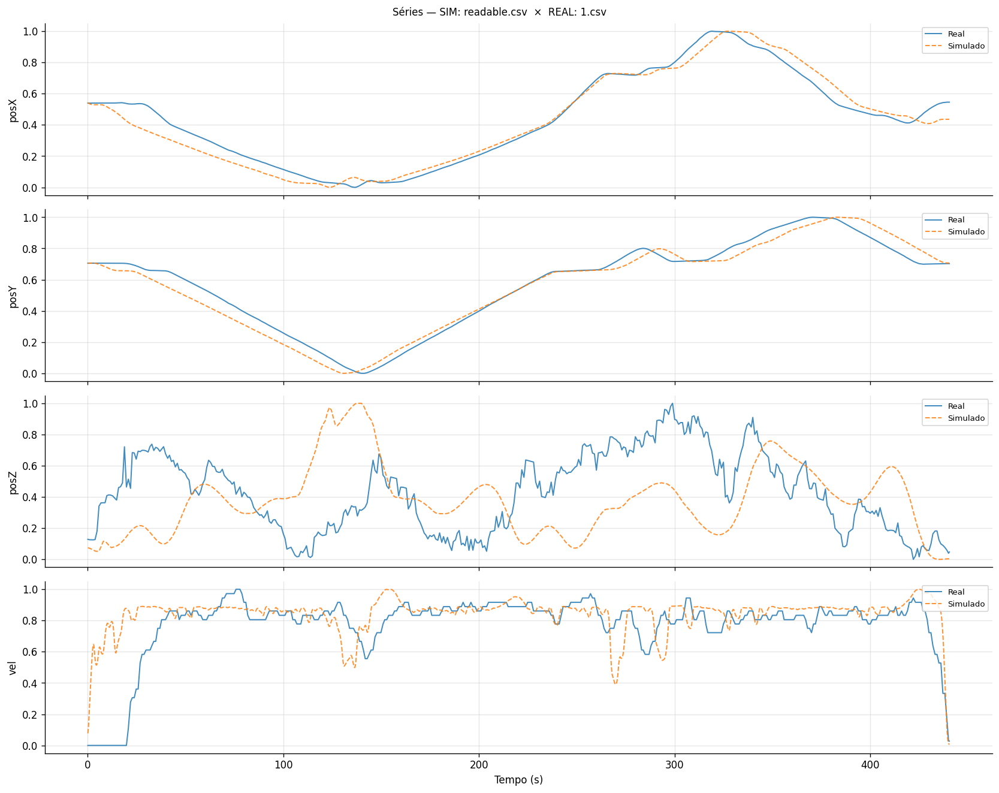

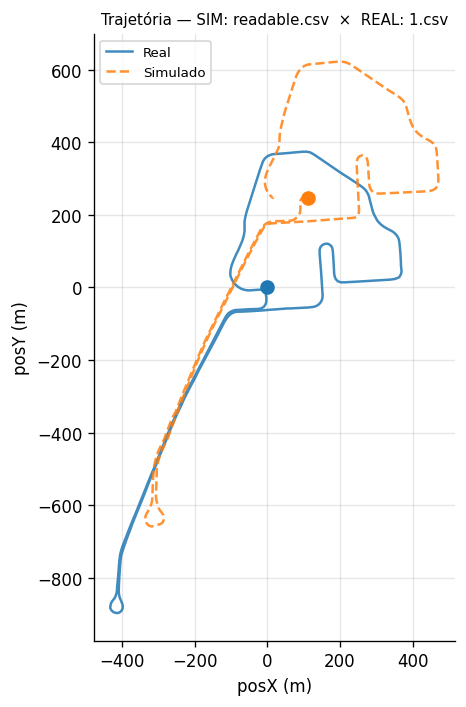

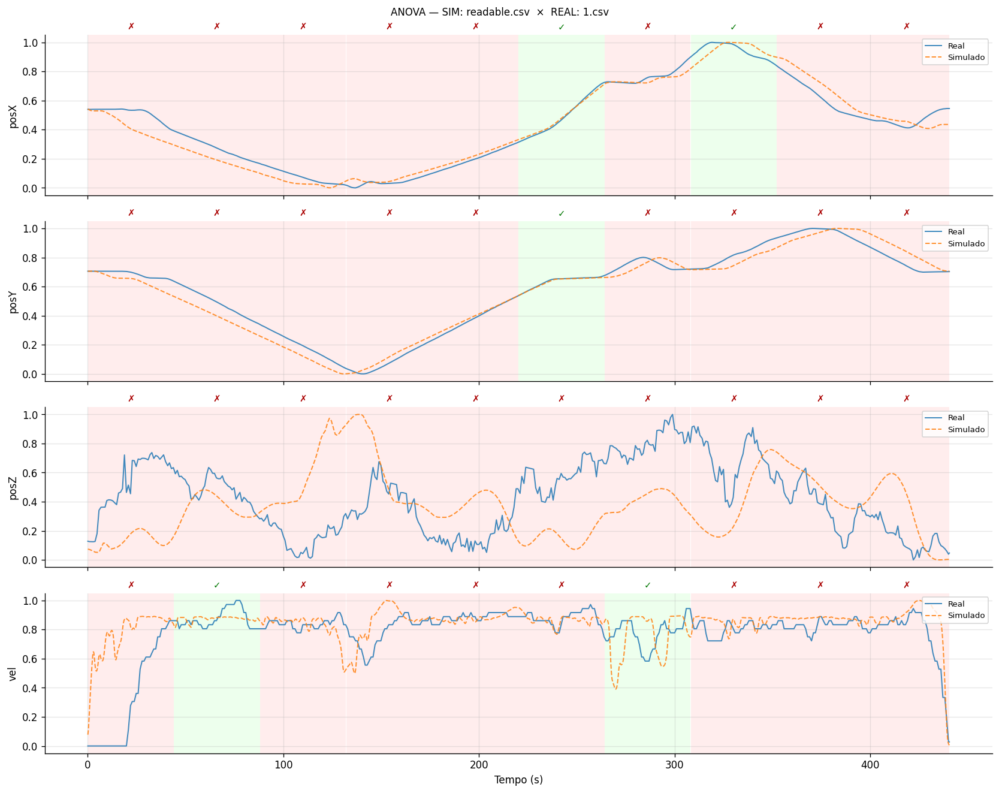

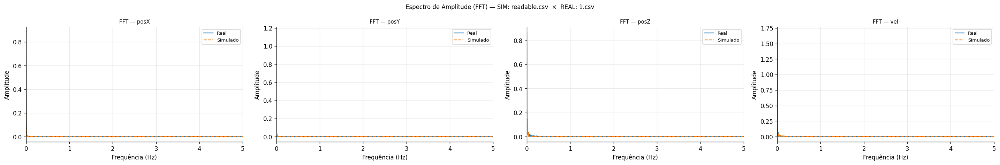

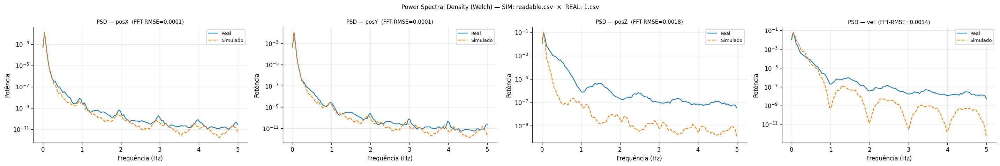

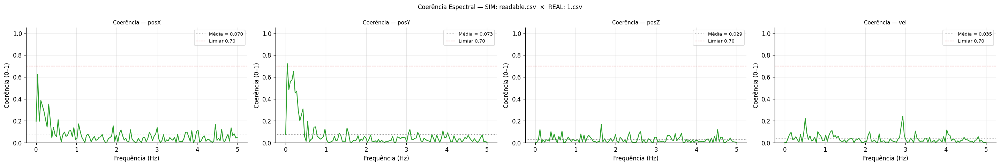

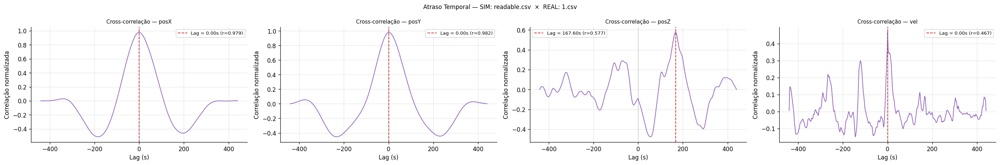

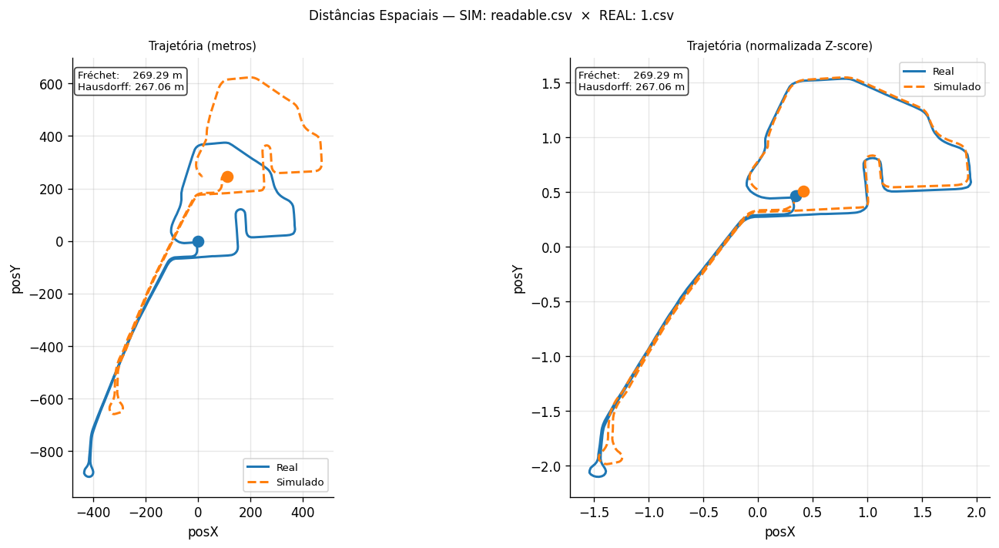

    Fréchet Distance  : 269.2921 m
    Hausdorff Distance: 267.0634 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9793  0.9998  0.0611  0.0483    0.000  0.0701  0.0885  0.7909  Boa
    posY     0.9815  1.0000  0.0566  0.0466    0.000  0.0733  0.1013  0.7921  Boa
    posZ    -0.0885  0.9987  0.3515  0.2957  167.600  0.0286  0.1946  0.4285  Baixa
    vel      0.4672  0.9994  0.1944  0.1139    0.000  0.0350  0.2421  0.6290  Moderada

  ── SIM: readable.csv  ×  REAL: 10.csv
    Amostras: 3912 | Lags: {'posZ': 0, 'vel': 0, 'posX': -218, 'posY': -128}


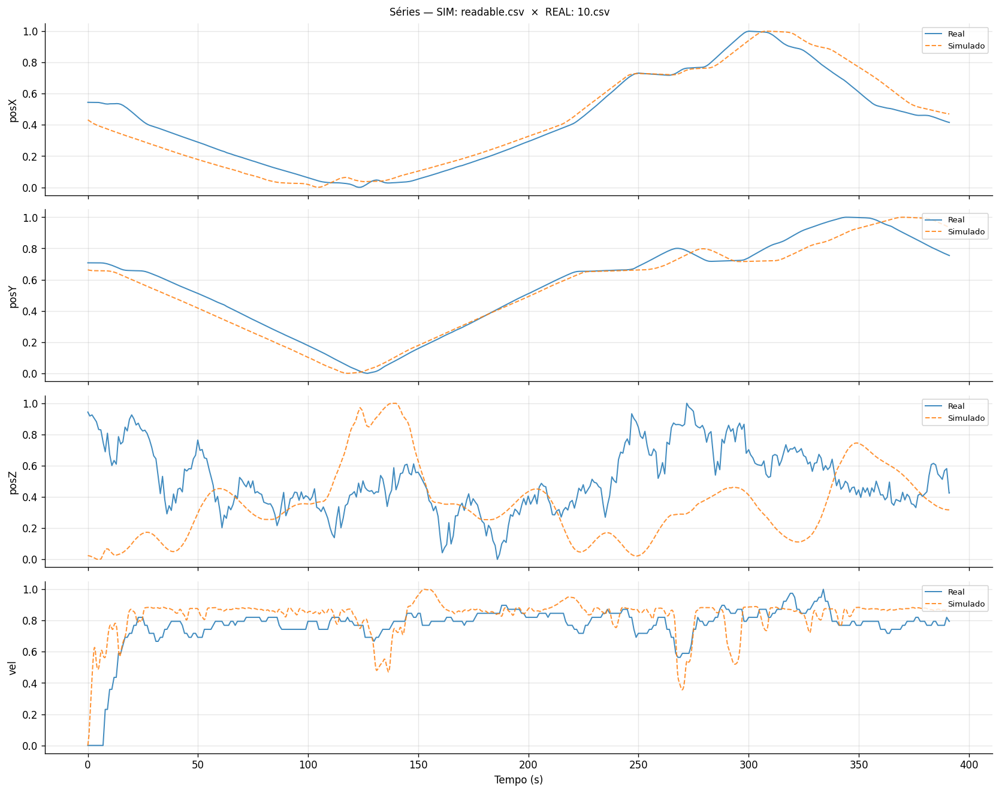

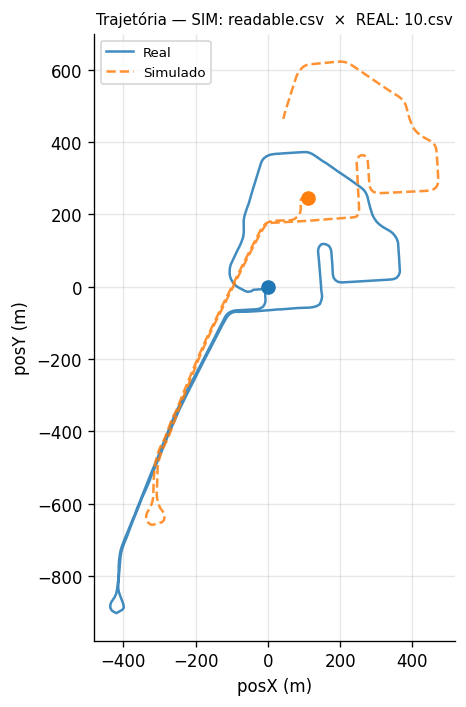

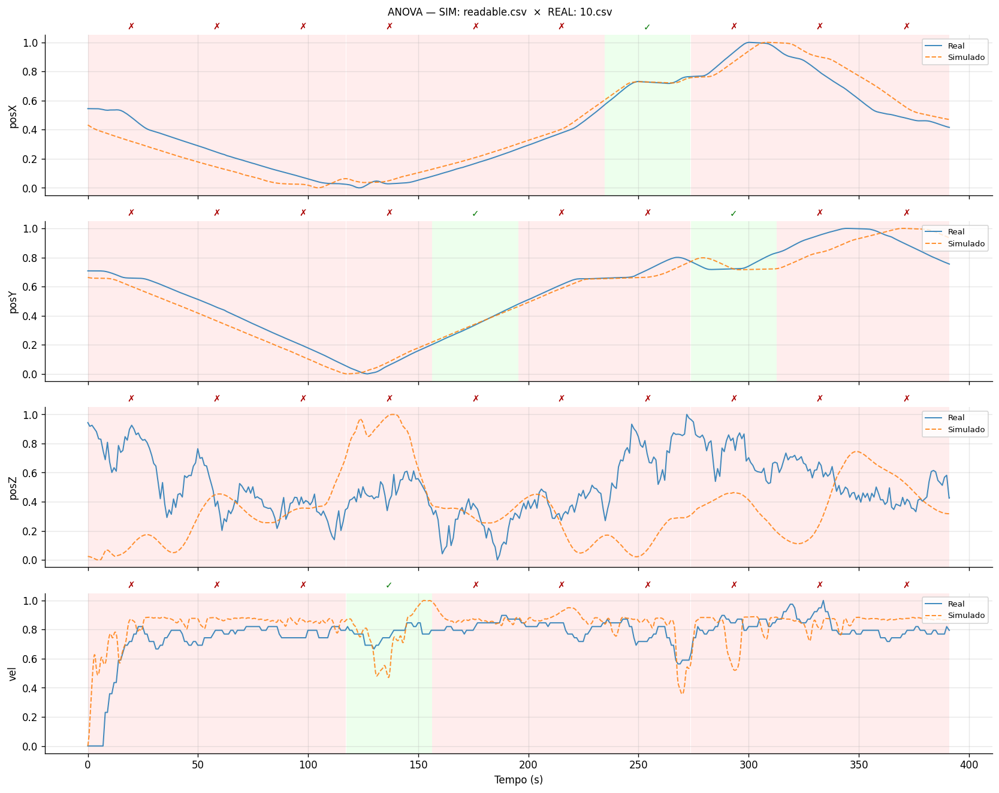

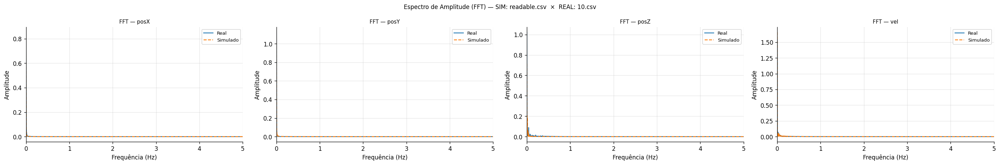

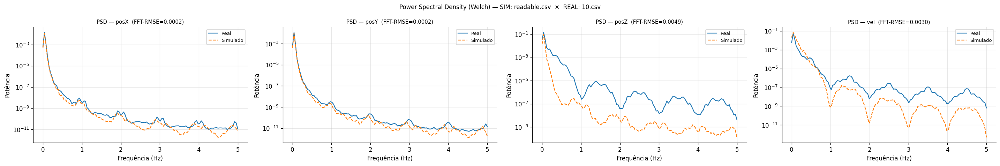

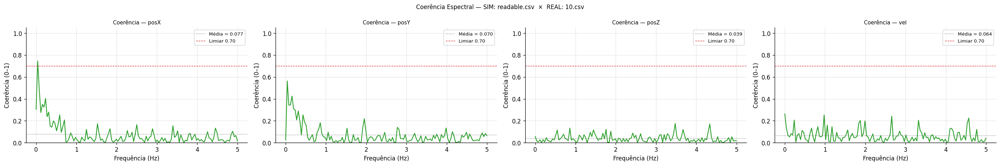

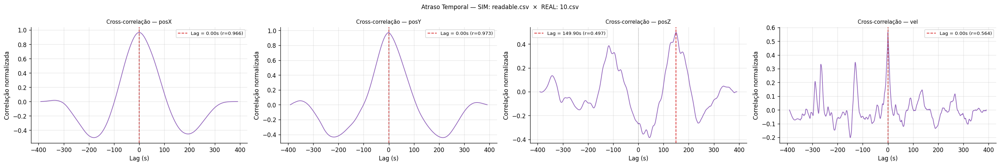

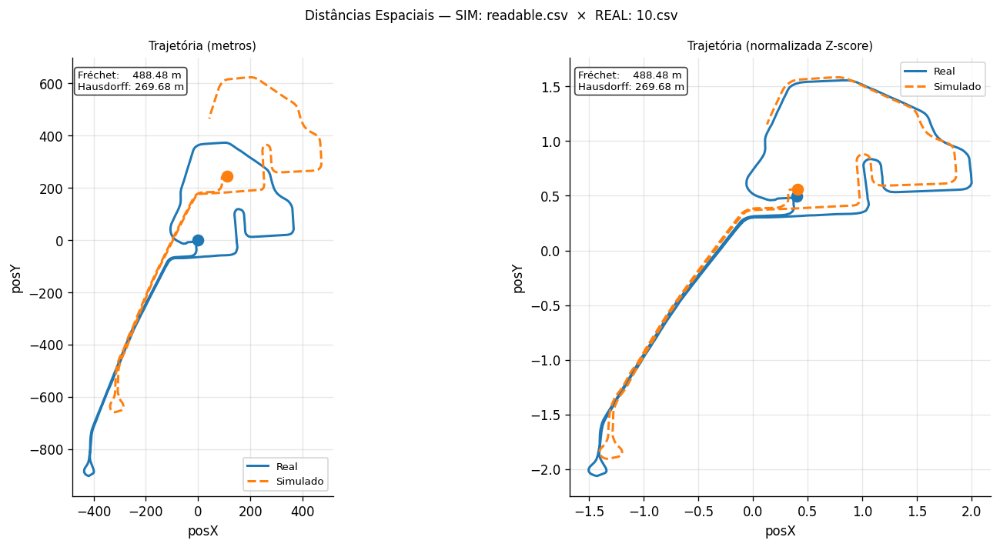

    Fréchet Distance  : 488.4809 m
    Hausdorff Distance: 269.6818 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9660  0.9996  0.0820  0.0662    0.000  0.0766  0.1866  0.7797  Boa
    posY     0.9735  0.9995  0.0720  0.0576    0.000  0.0697  0.1799  0.7827  Boa
    posZ    -0.2709  0.9964  0.3808  0.3077  149.900  0.0389  0.3678  0.4163  Baixa
    vel      0.5640  0.9991  0.1318  0.0980    0.000  0.0637  0.6286  0.6524  Moderada

  ── SIM: readable.csv  ×  REAL: 2.csv
    Amostras: 4286 | Lags: {'posZ': 0, 'vel': 0, 'posX': -76, 'posY': -24}


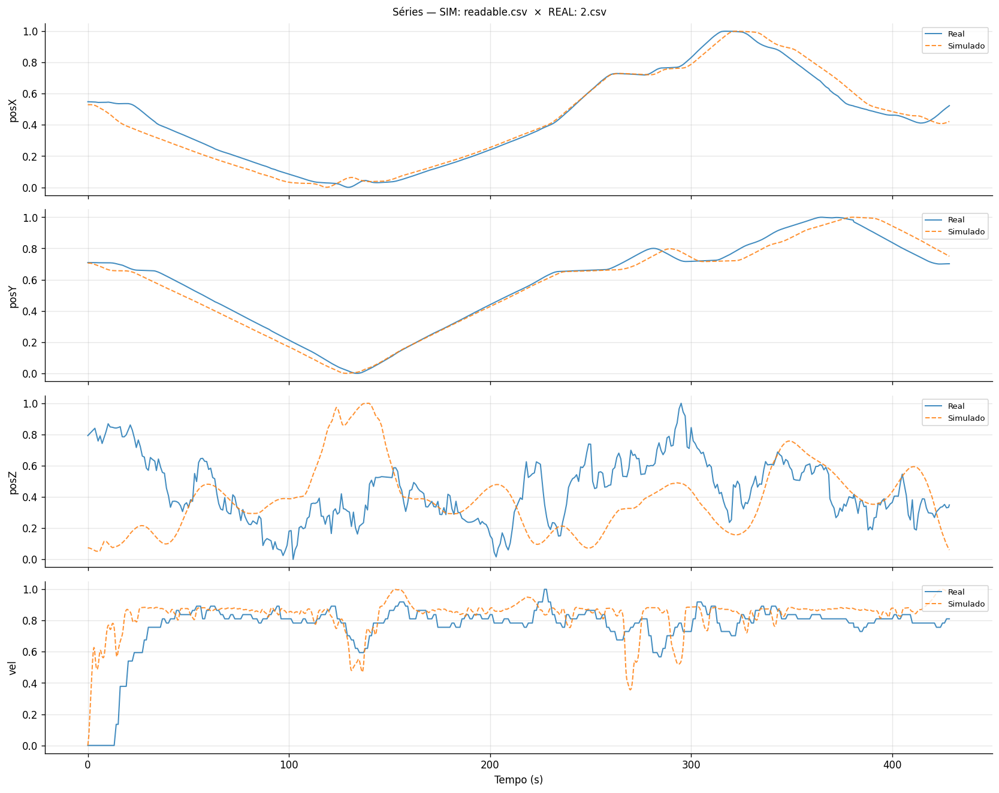

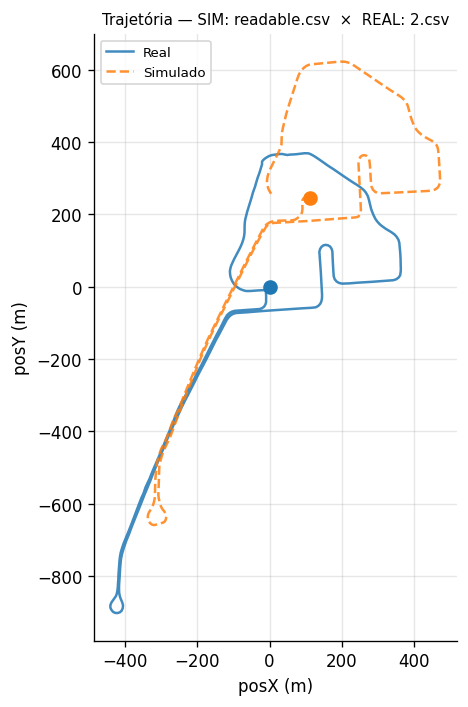

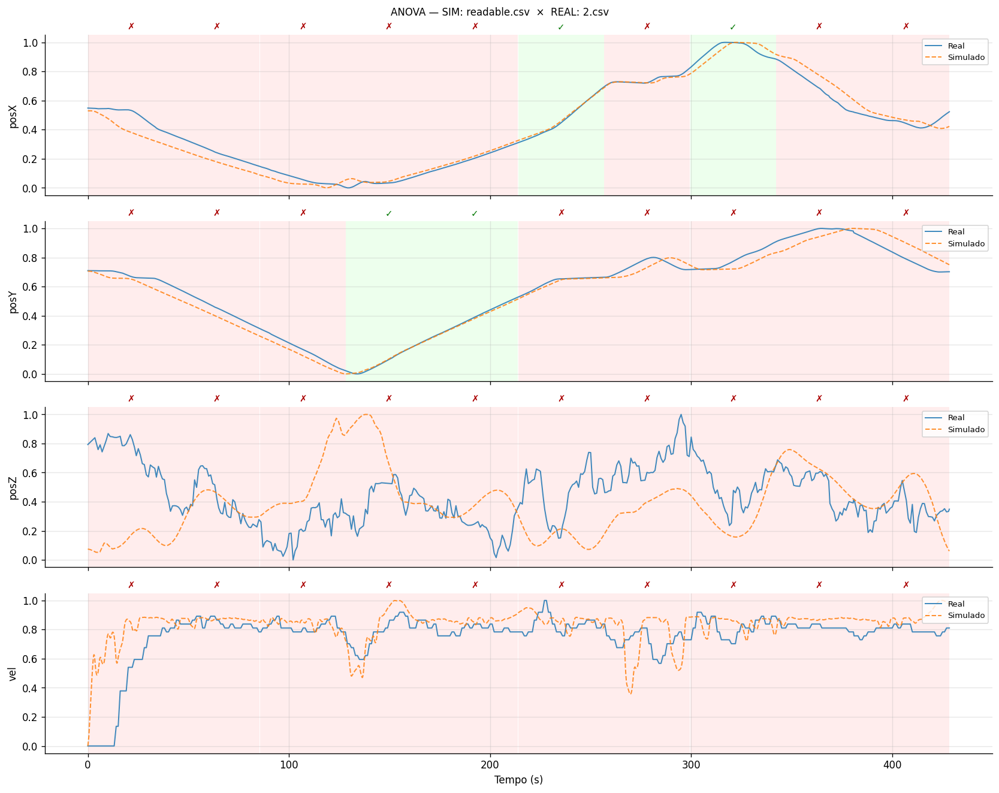

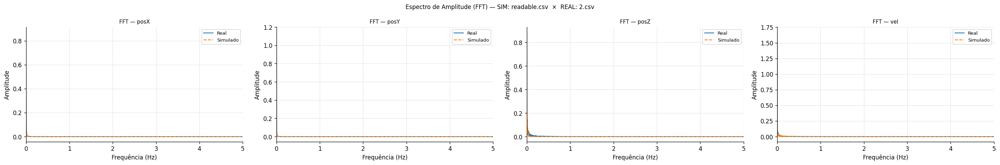

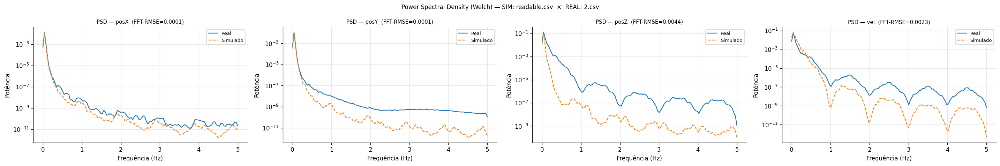

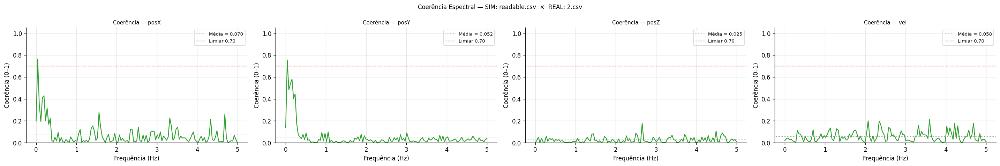

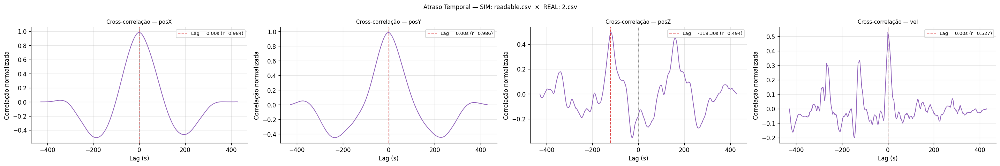

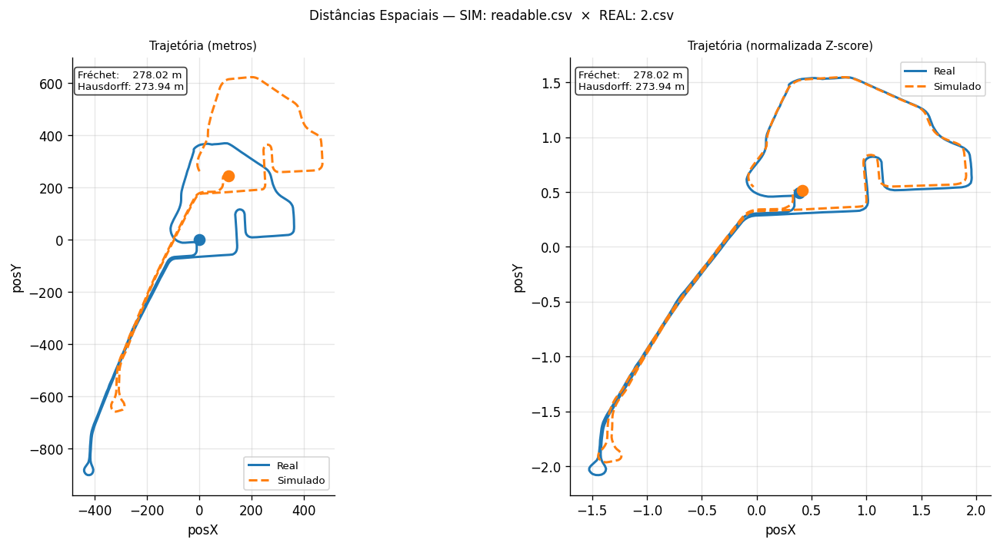

    Fréchet Distance  : 278.0171 m
    Hausdorff Distance: 273.9398 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9845  0.9999  0.0537  0.0408    0.000  0.0704  0.0830  0.7938  Boa
    posY     0.9862  0.9999  0.0501  0.0394    0.000  0.0521  0.1235  0.7901  Boa
    posZ    -0.1776  0.9967  0.3237  0.2502 -119.300  0.0249  0.3848  0.4324  Baixa
    vel      0.5275  0.9993  0.1586  0.1031    0.000  0.0576  0.4621  0.6448  Moderada

  ── SIM: readable.csv  ×  REAL: 3.csv
    Amostras: 4201 | Lags: {'posZ': 0, 'vel': 0, 'posX': -98, 'posY': -52}


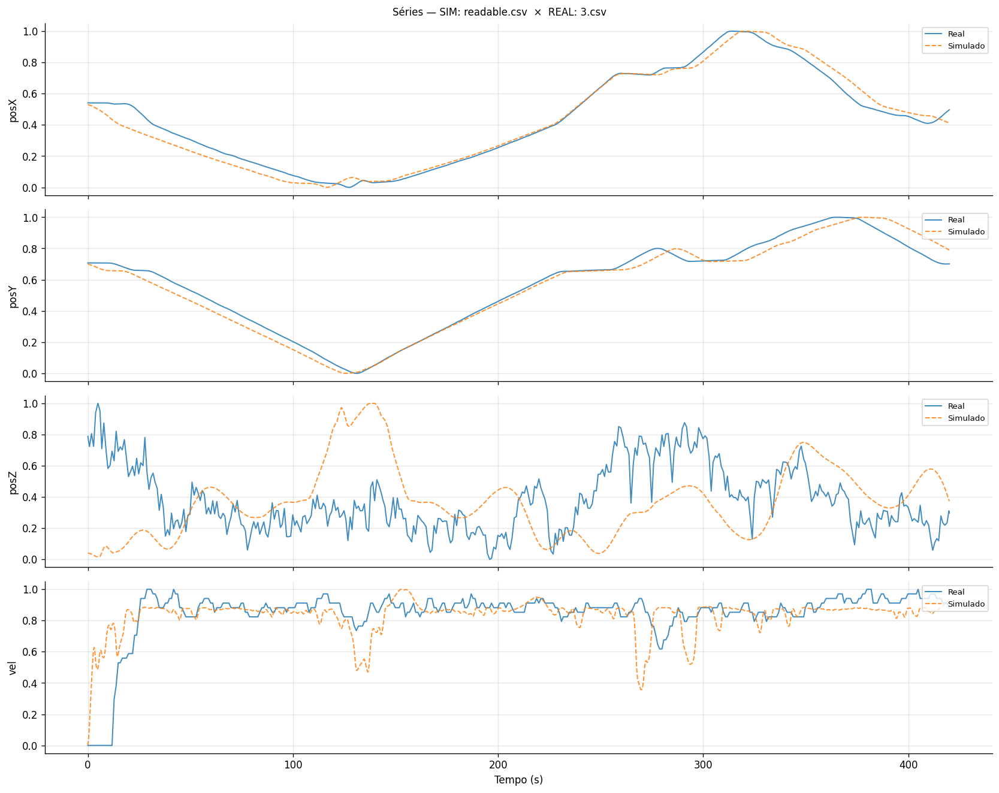

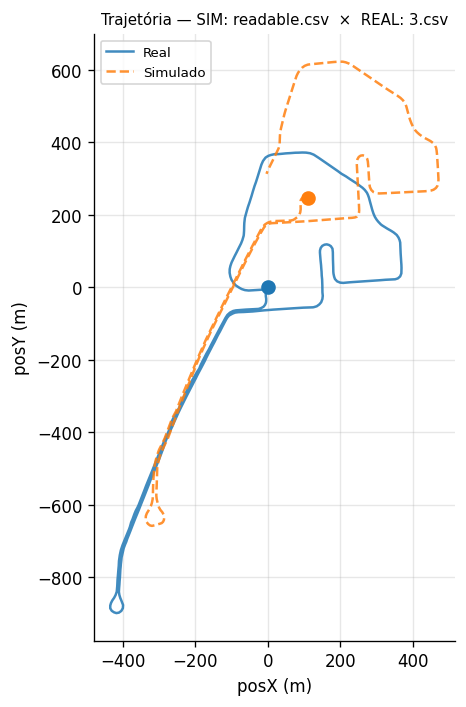

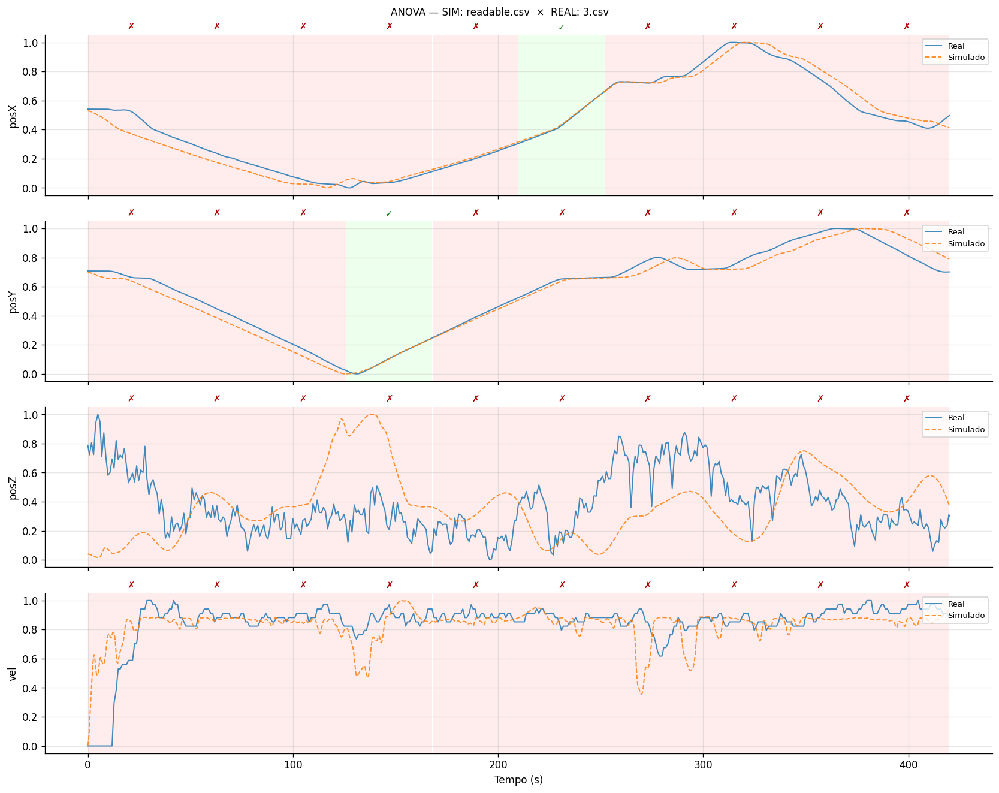

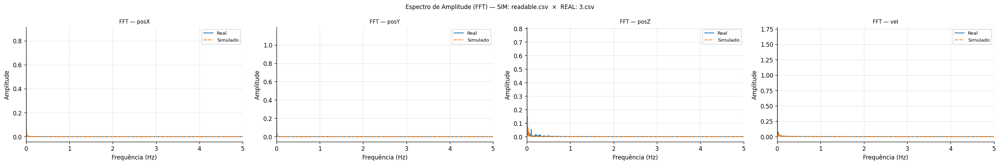

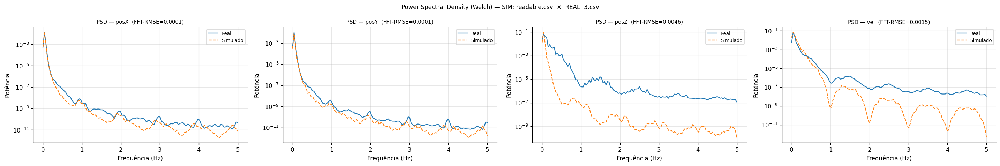

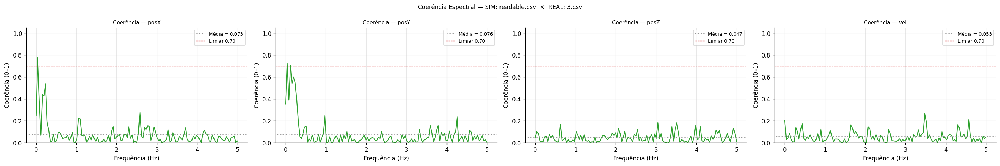

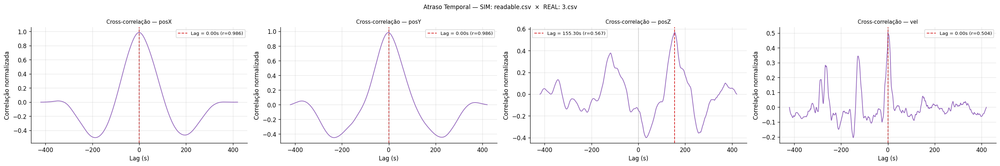

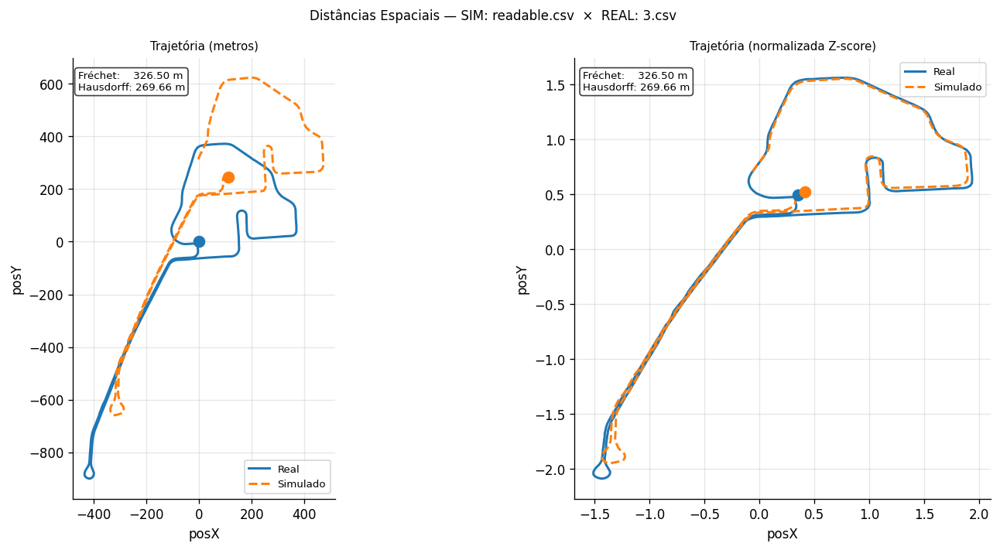

    Fréchet Distance  : 326.5037 m
    Hausdorff Distance: 269.6610 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9861  0.9999  0.0514  0.0388    0.000  0.0731  0.0995  0.7942  Boa
    posY     0.9858  0.9998  0.0516  0.0406    0.000  0.0761  0.1254  0.7933  Boa
    posZ    -0.1487  0.9970  0.3263  0.2634  155.300  0.0465  0.5539  0.4178  Baixa
    vel      0.5037  0.9991  0.1478  0.0866    0.000  0.0532  0.2434  0.6496  Moderada

  ── SIM: readable.csv  ×  REAL: 4.csv
    Amostras: 4138 | Lags: {'posZ': 0, 'vel': 0, 'posX': -123, 'posY': -74}


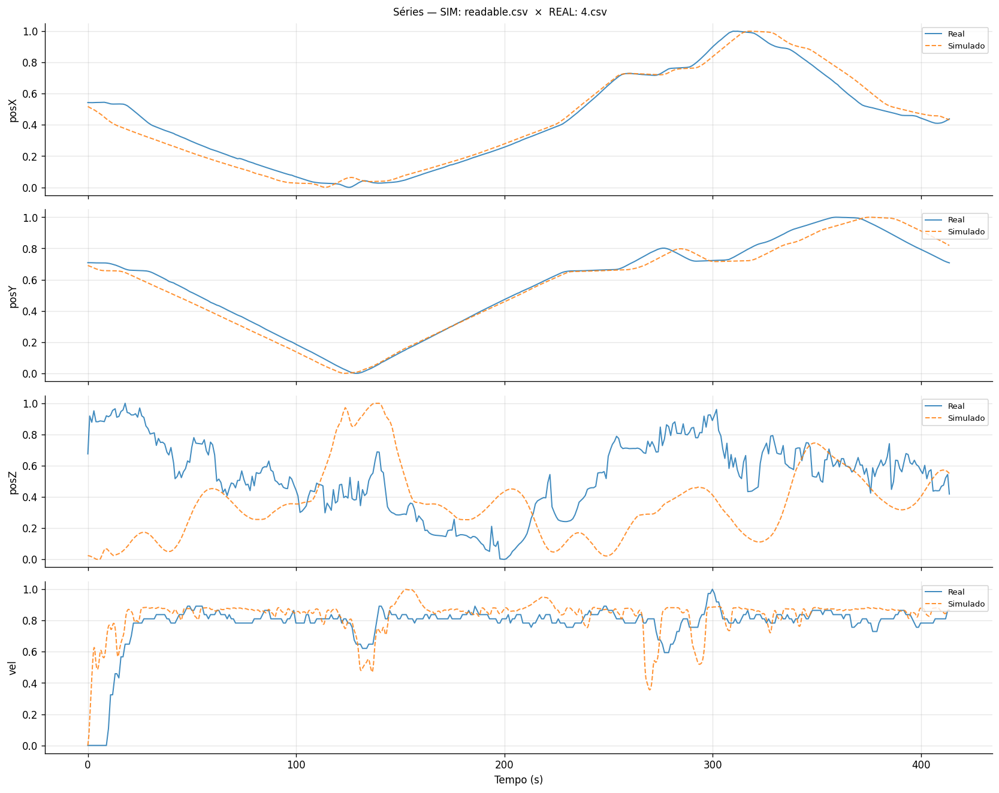

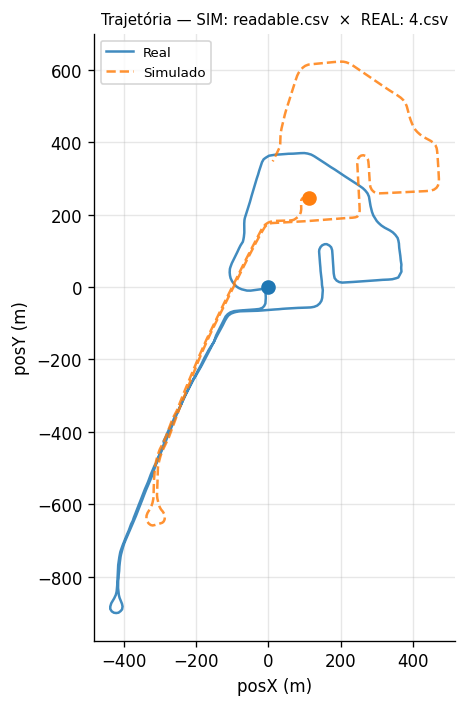

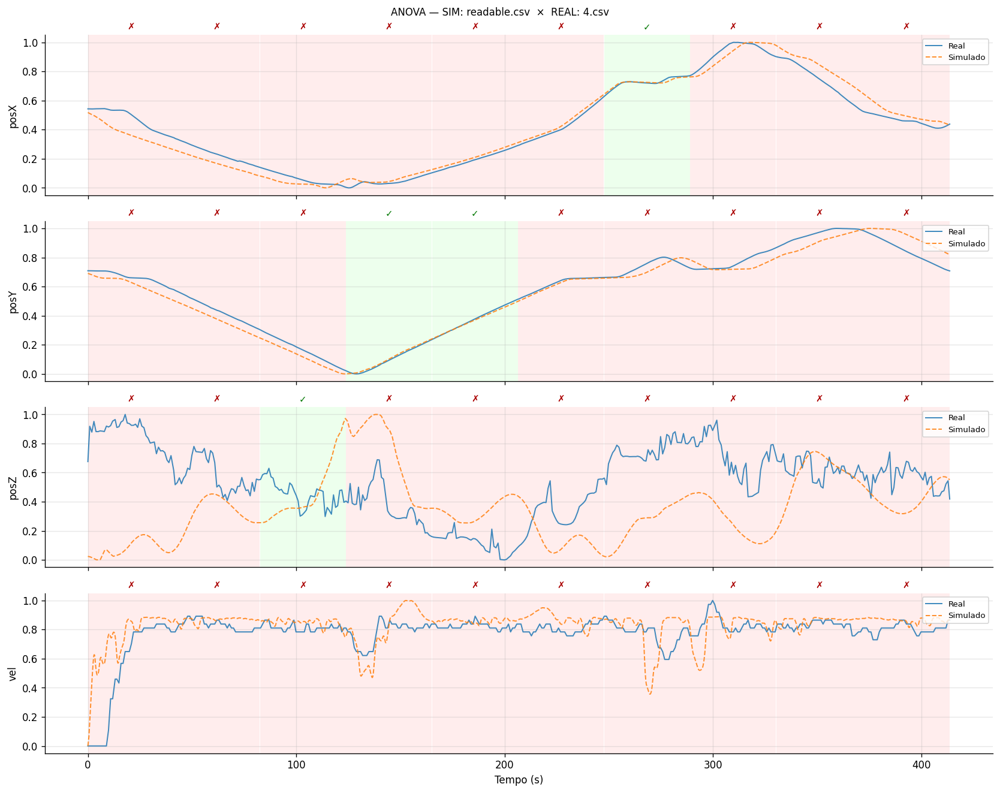

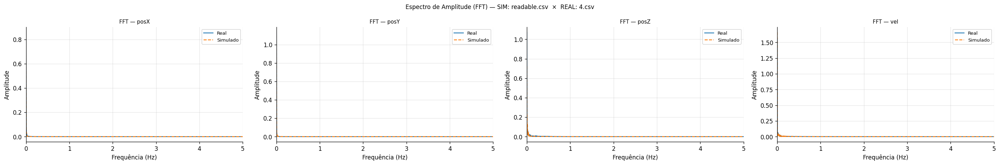

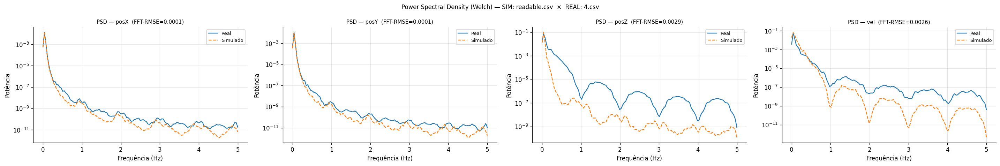

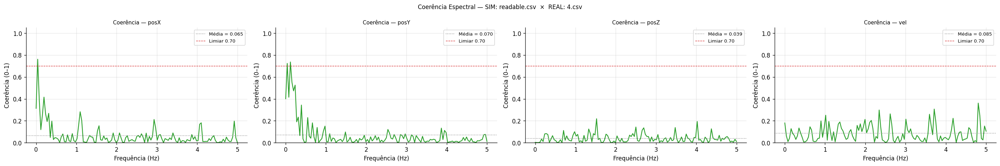

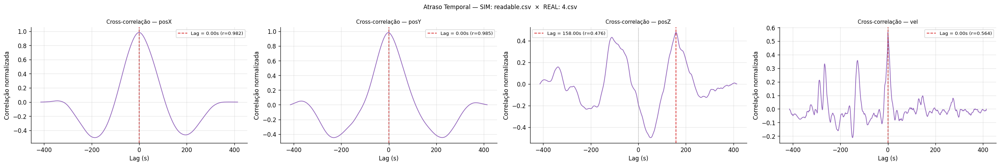

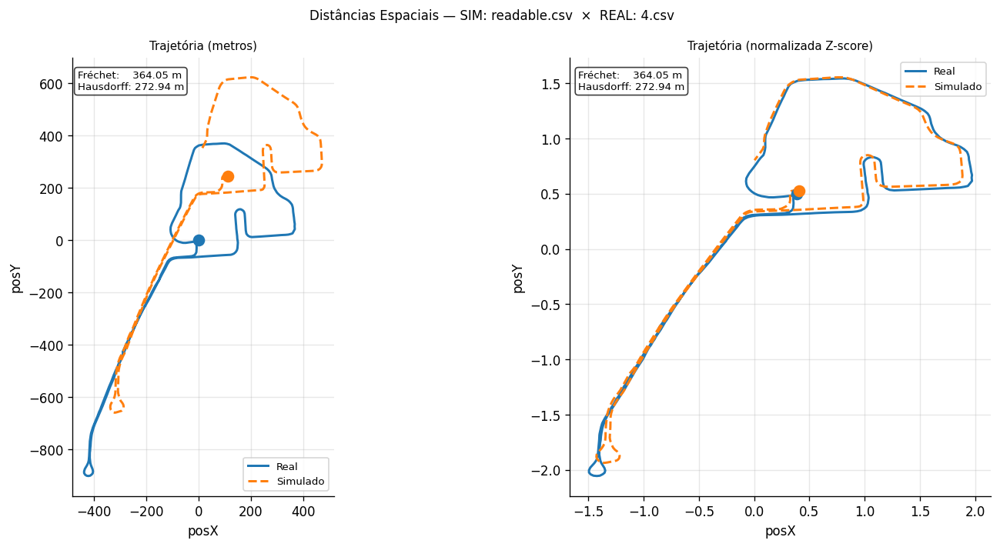

    Fréchet Distance  : 364.0464 m
    Hausdorff Distance: 272.9416 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9824  0.9999  0.0576  0.0454    0.000  0.0649  0.1033  0.7908  Boa
    posY     0.9849  0.9998  0.0531  0.0419    0.000  0.0695  0.1259  0.7917  Boa
    posZ    -0.1890  0.9961  0.3967  0.3267  158.000  0.0394  0.3988  0.4125  Baixa
    vel      0.5641  0.9993  0.1307  0.0836    0.000  0.0851  0.5068  0.6619  Moderada

  ── SIM: readable.csv  ×  REAL: 5.csv
    Amostras: 4124 | Lags: {'posZ': 0, 'vel': 0, 'posX': -136, 'posY': -71}


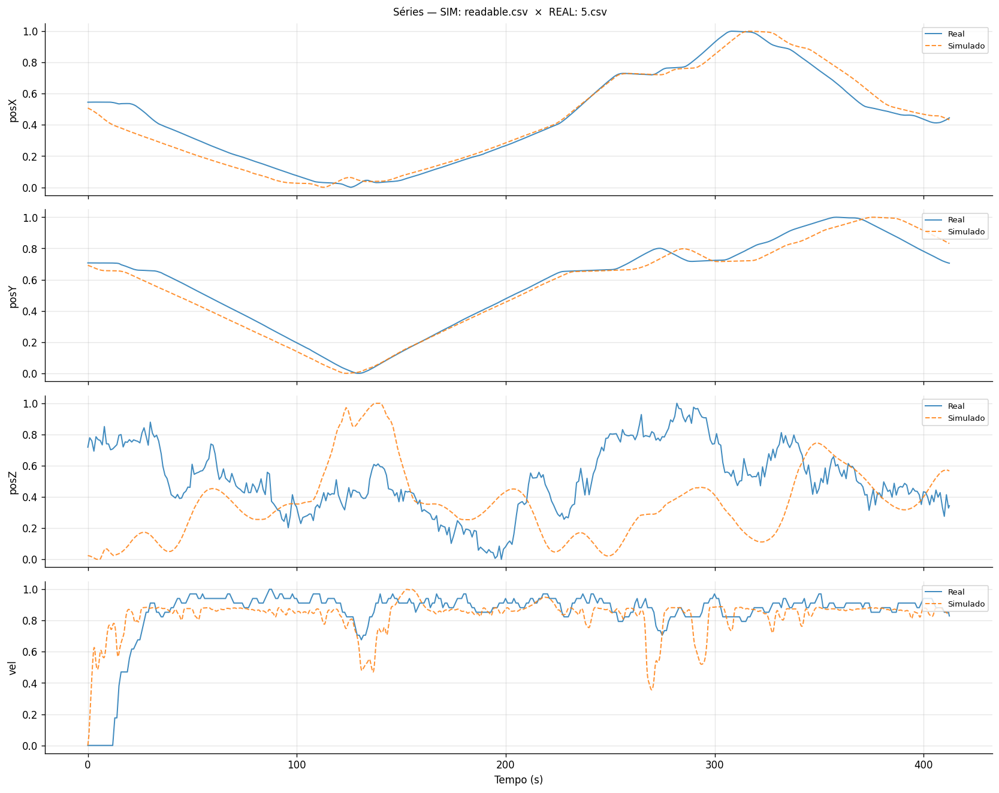

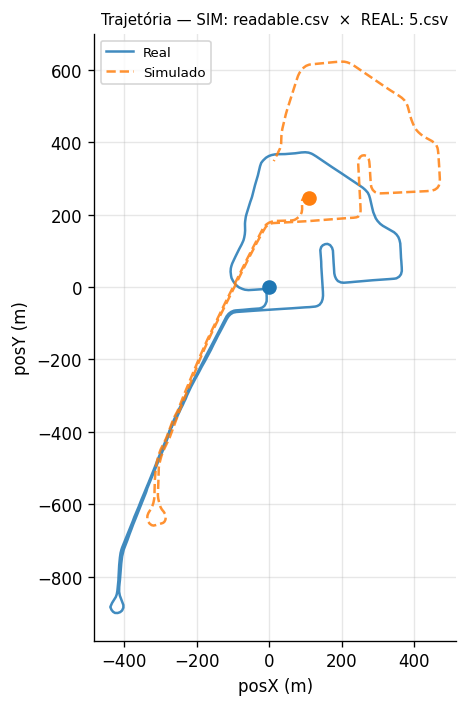

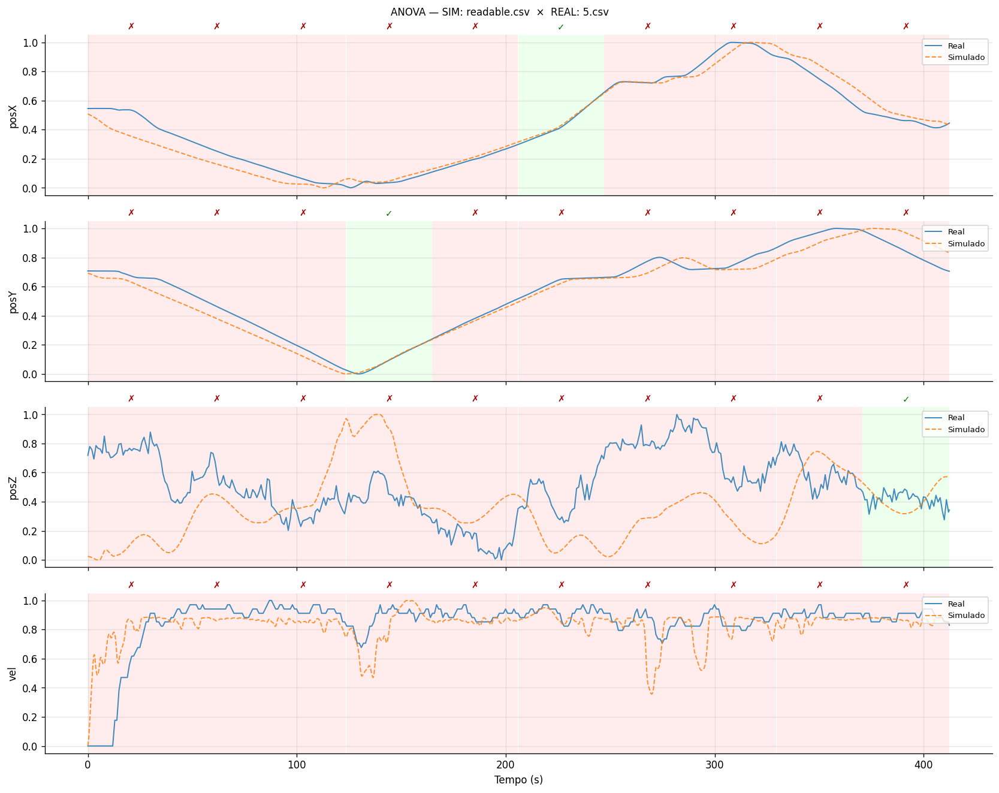

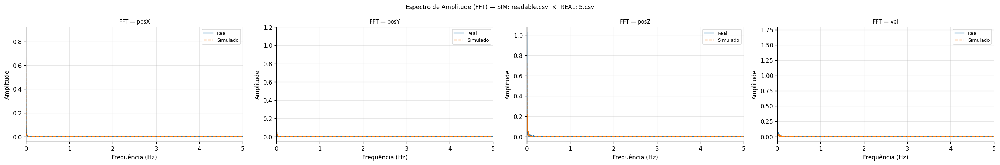

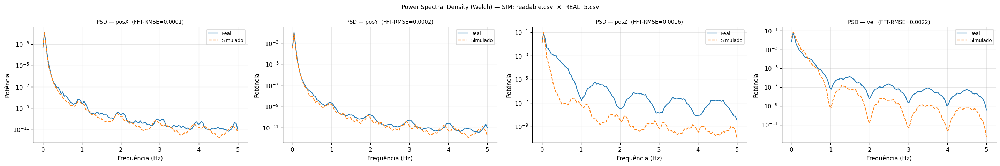

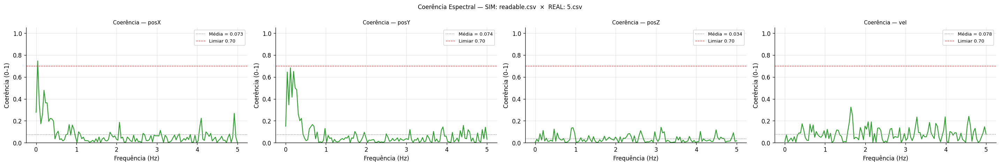

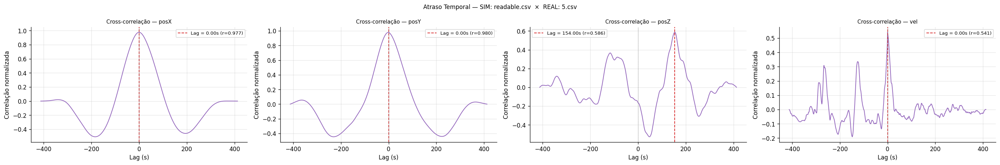

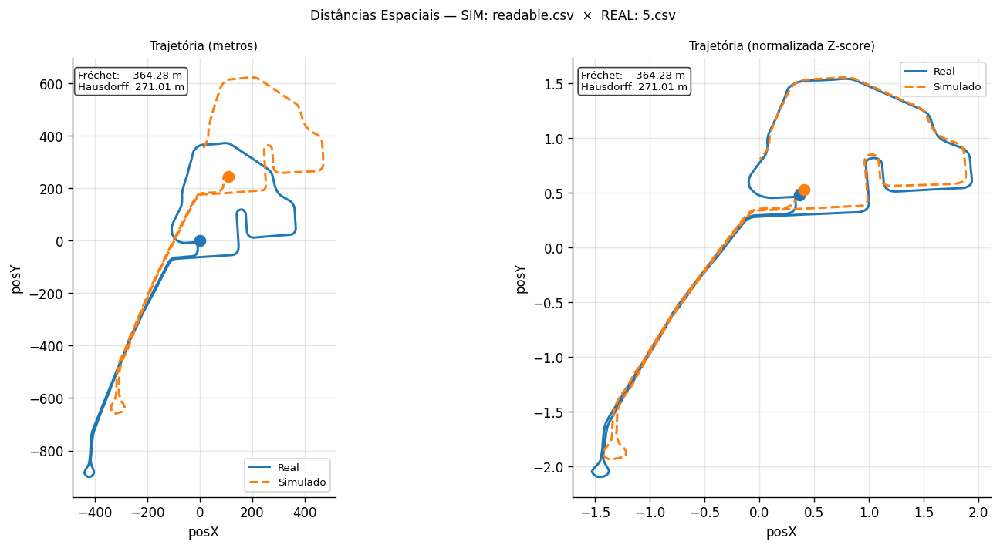

    Fréchet Distance  : 364.2813 m
    Hausdorff Distance: 271.0055 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9768  0.9999  0.0669  0.0506    0.000  0.0726  0.0922  0.7894  Boa
    posY     0.9802  0.9997  0.0621  0.0499    0.000  0.0736  0.1577  0.7880  Boa
    posZ    -0.1657  0.9965  0.3714  0.3045  154.000  0.0342  0.1835  0.4272  Baixa
    vel      0.5409  0.9990  0.1508  0.0906    0.000  0.0779  0.4248  0.6549  Moderada

  ── SIM: readable.csv  ×  REAL: 6.csv
    Amostras: 4249 | Lags: {'posZ': 0, 'vel': 0, 'posX': -91, 'posY': -78}


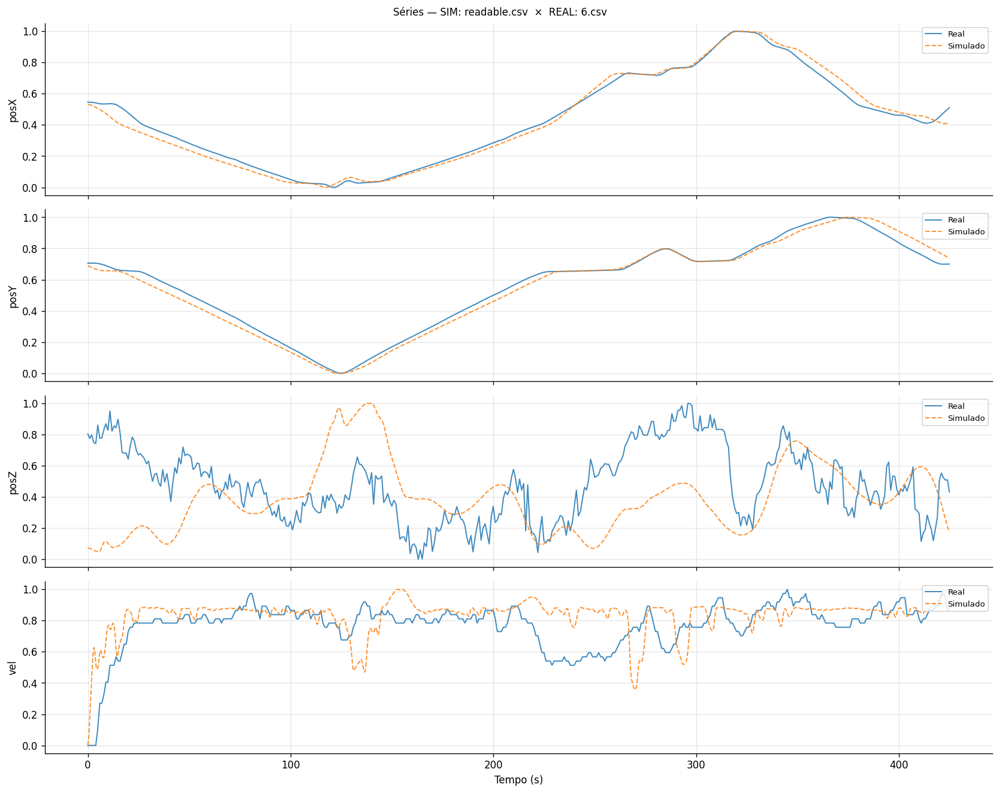

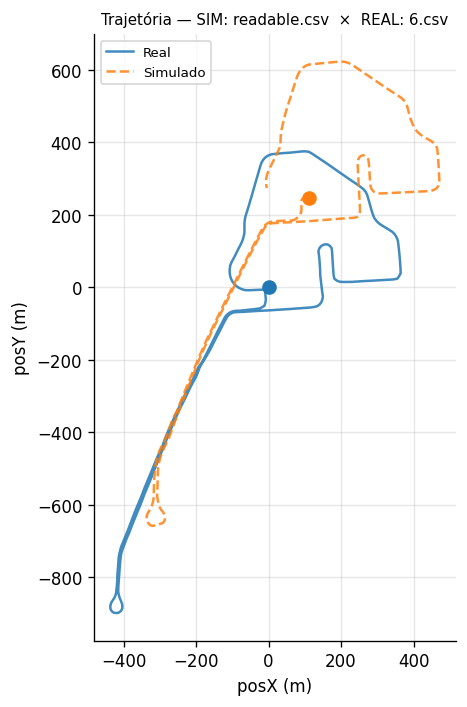

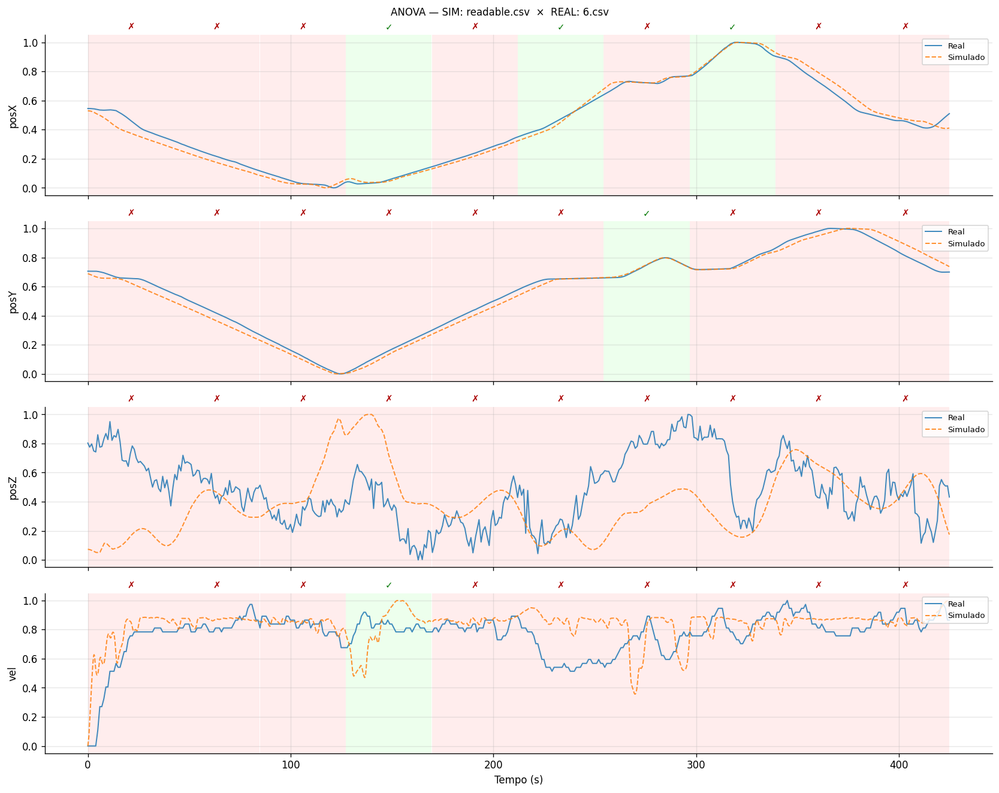

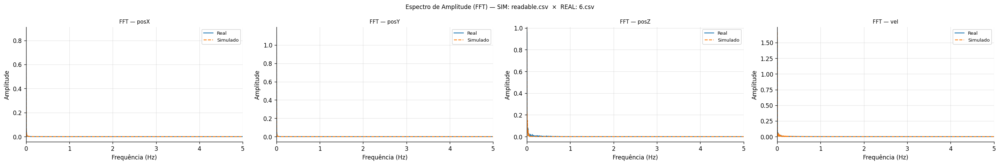

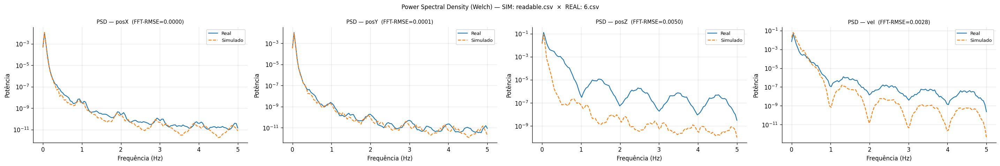

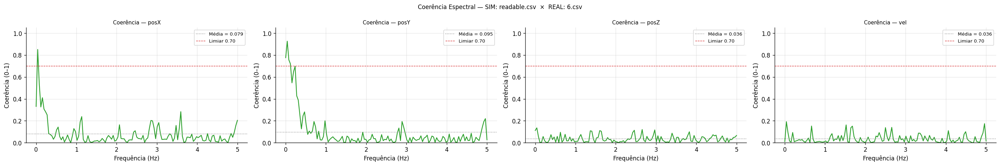

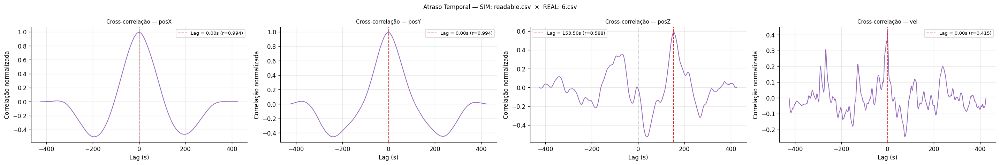

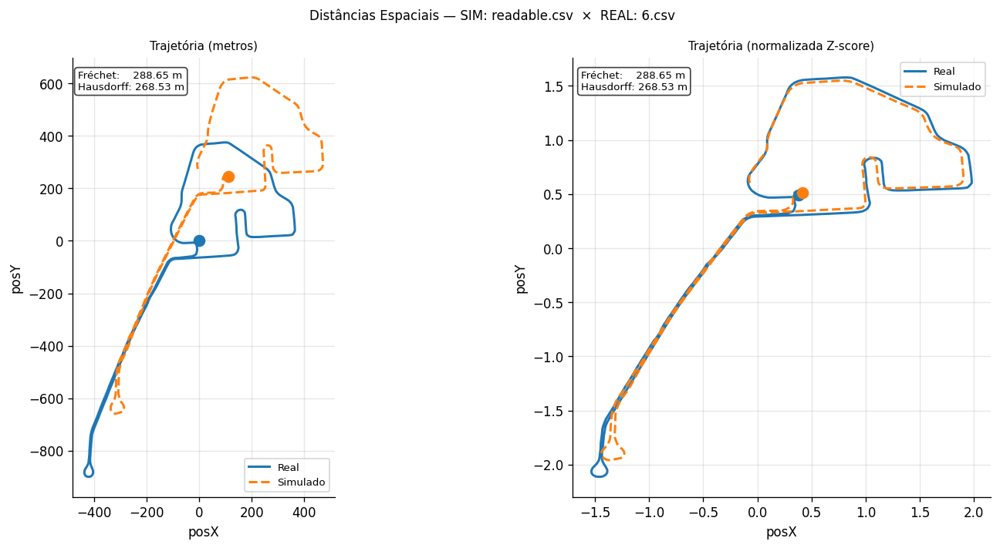

    Fréchet Distance  : 288.6547 m
    Hausdorff Distance: 268.5311 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9936  0.9999  0.0367  0.0285    0.000  0.0791  0.0056  0.8043  Boa
    posY     0.9943  0.9999  0.0361  0.0290    0.000  0.0949  0.1167  0.8014  Boa
    posZ    -0.0161  0.9968  0.3271  0.2627  153.500  0.0361  0.4184  0.4237  Baixa
    vel      0.4155  0.9994  0.1514  0.1104    0.000  0.0363  0.6913  0.5977  Moderada

  ── SIM: readable.csv  ×  REAL: 7.csv
    Amostras: 3931 | Lags: {'posZ': 0, 'vel': 0, 'posX': -239, 'posY': -164}


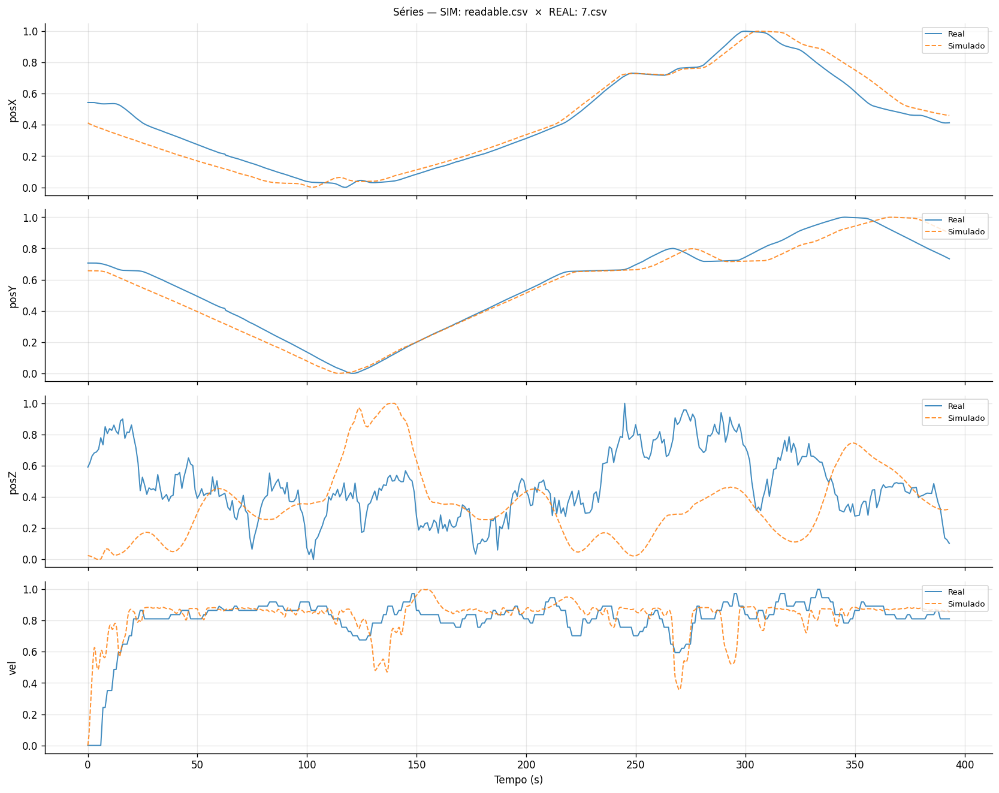

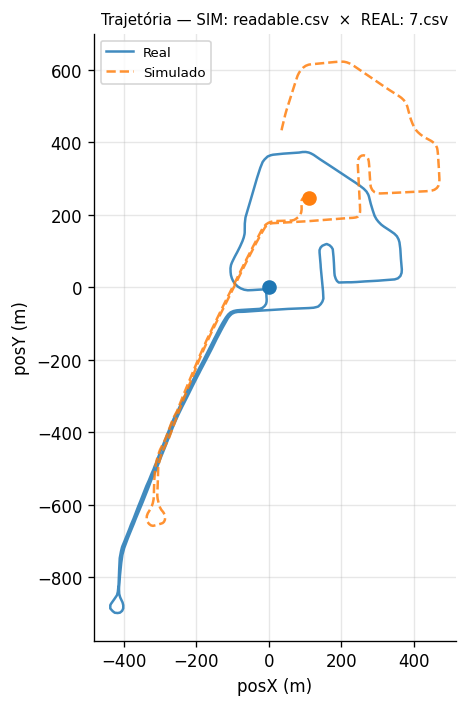

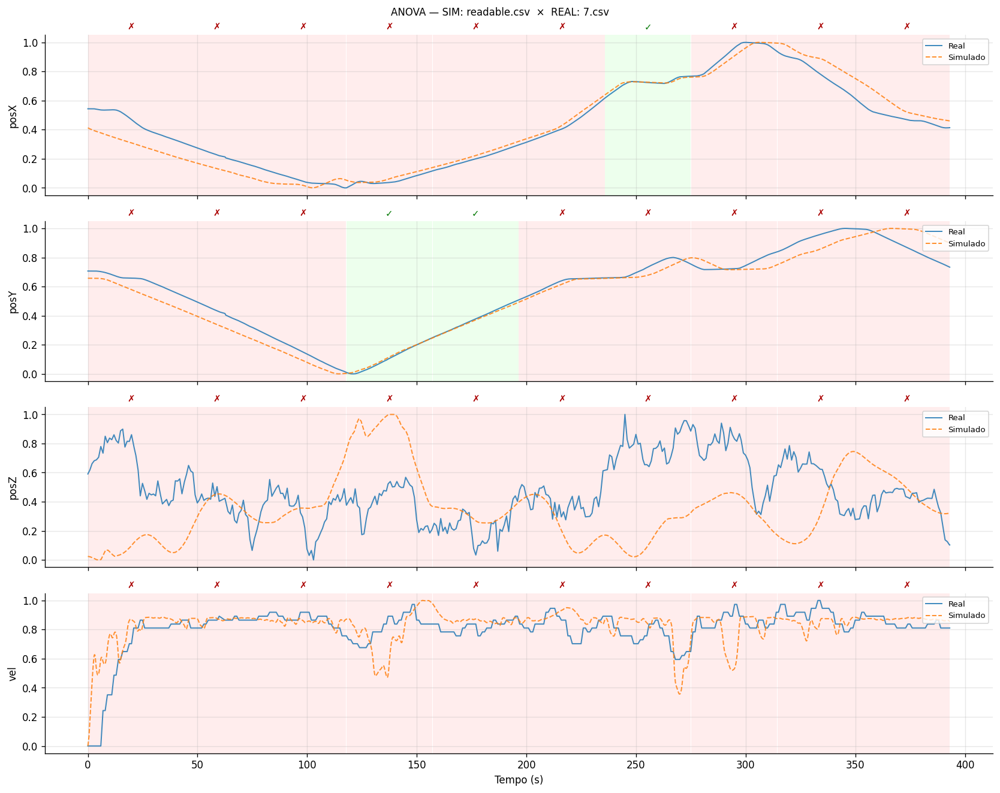

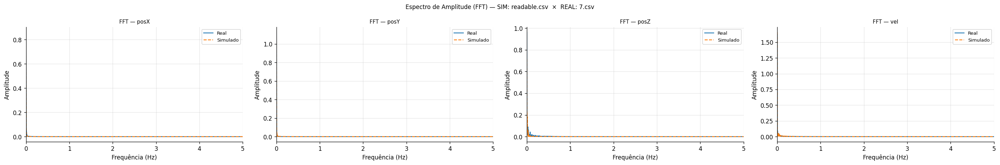

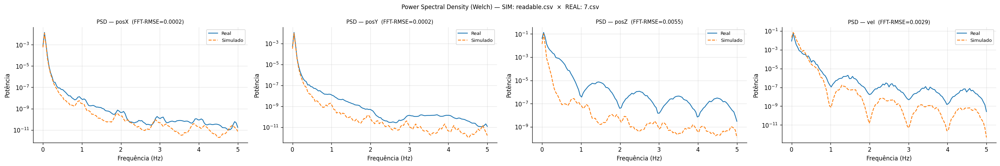

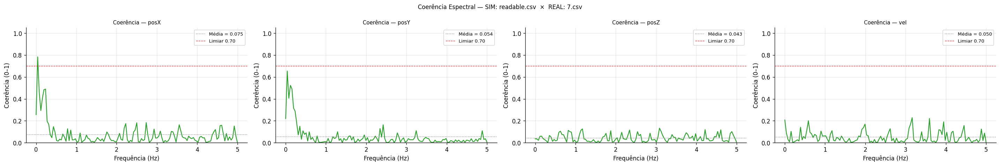

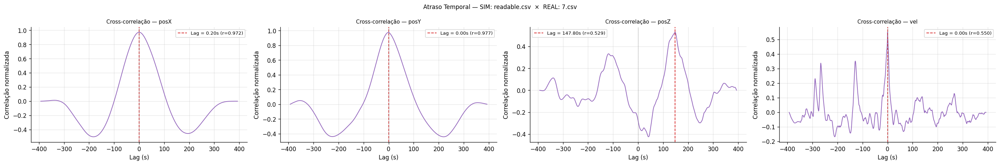

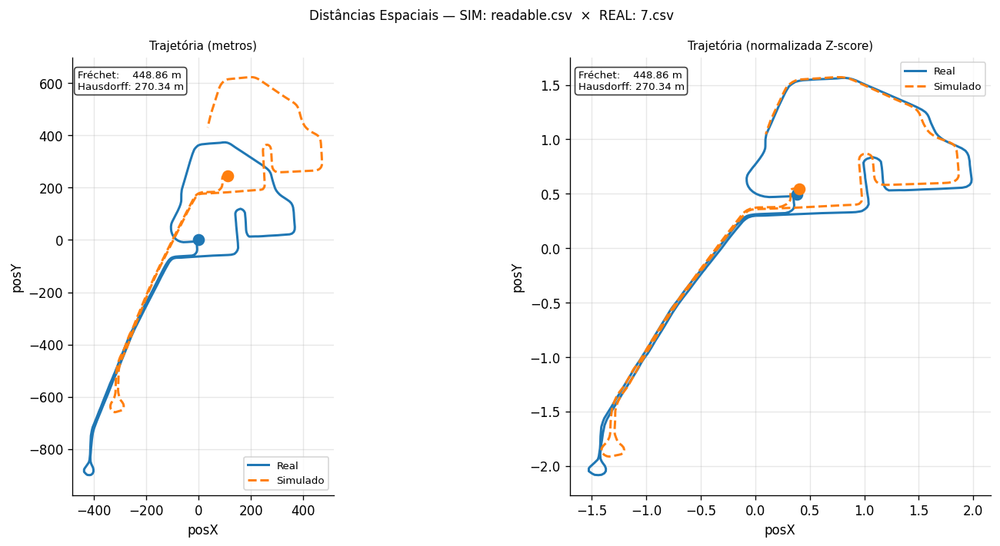

    Fréchet Distance  : 448.8613 m
    Hausdorff Distance: 270.3367 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9718  0.9996  0.0751  0.0573    0.200  0.0745  0.1682  0.7830  Boa
    posY     0.9767  0.9996  0.0676  0.0522    0.000  0.0538  0.1794  0.7820  Boa
    posZ    -0.2781  0.9966  0.3767  0.3019  147.800  0.0428  0.4193  0.4157  Baixa
    vel      0.5496  0.9992  0.1240  0.0822    0.000  0.0505  0.5627  0.6505  Moderada

  ── SIM: readable.csv  ×  REAL: 8.csv
    Amostras: 4044 | Lags: {'posZ': 0, 'vel': 0, 'posX': -166, 'posY': -104}


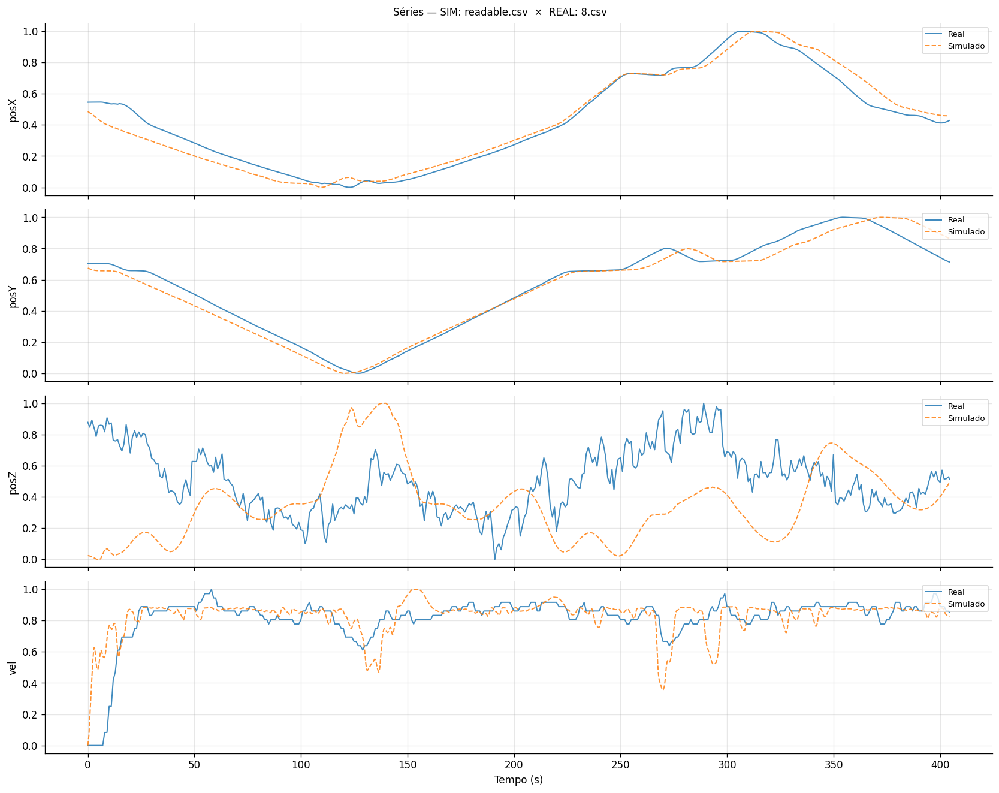

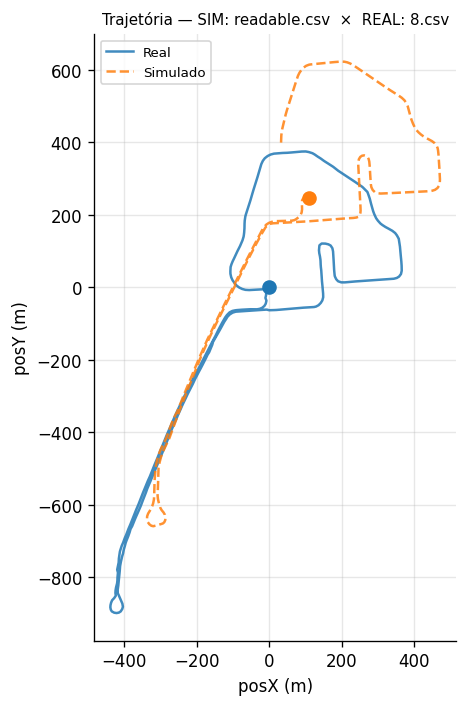

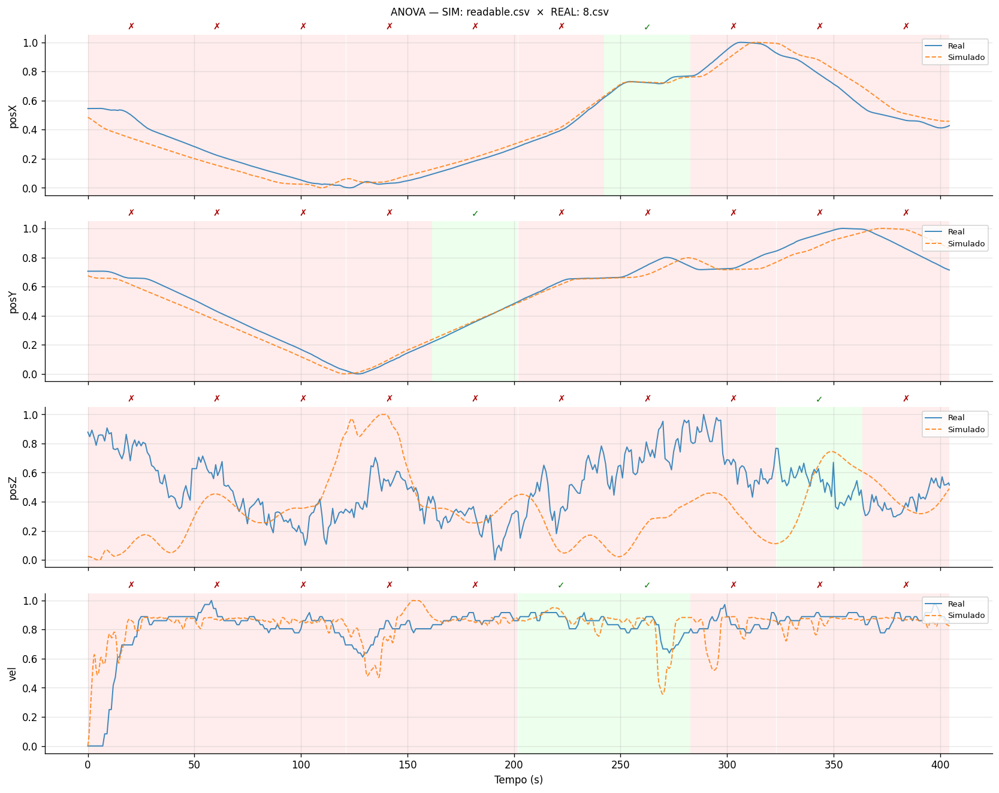

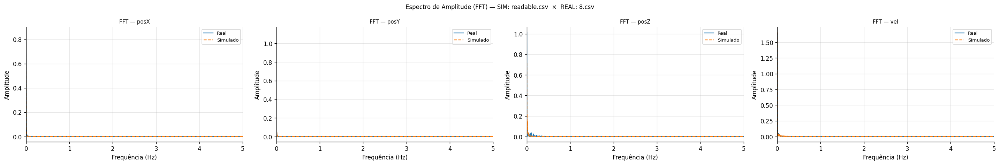

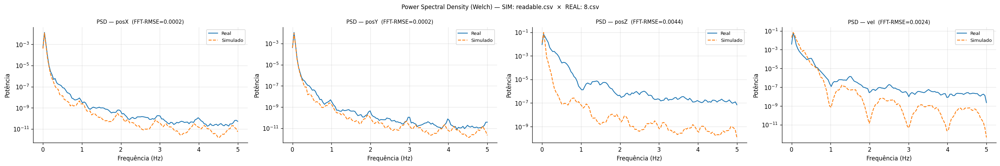

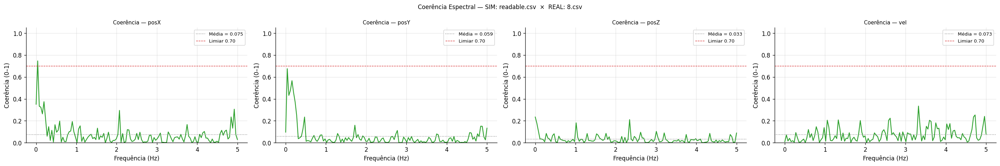

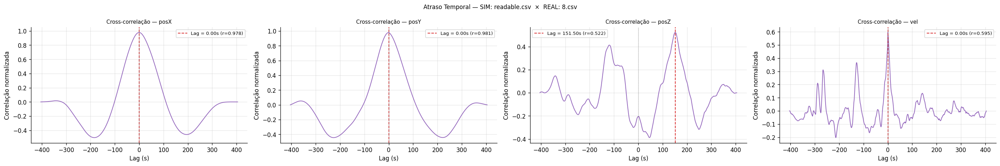

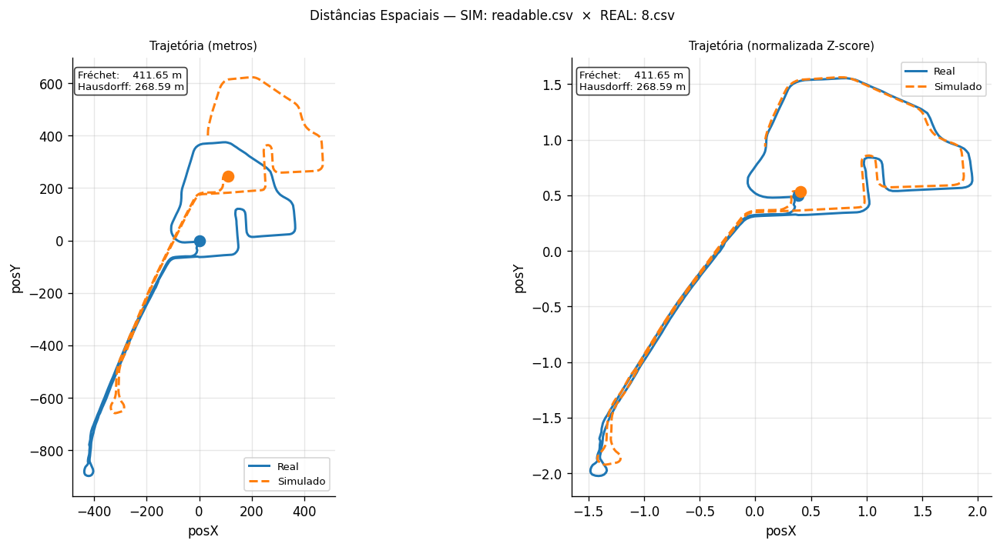

    Fréchet Distance  : 411.6505 m
    Hausdorff Distance: 268.5857 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9785  0.9998  0.0641  0.0506    0.000  0.0752  0.1360  0.7885  Boa
    posY     0.9810  0.9997  0.0585  0.0460    0.000  0.0591  0.1675  0.7861  Boa
    posZ    -0.2081  0.9964  0.3676  0.2987  151.500  0.0328  0.5961  0.4068  Baixa
    vel      0.5952  0.9993  0.1223  0.0727    0.000  0.0729  0.4166  0.6752  Moderada

  ── SIM: readable.csv  ×  REAL: 9.csv
    Amostras: 3937 | Lags: {'posZ': 0, 'vel': 0, 'posX': -223, 'posY': -139}


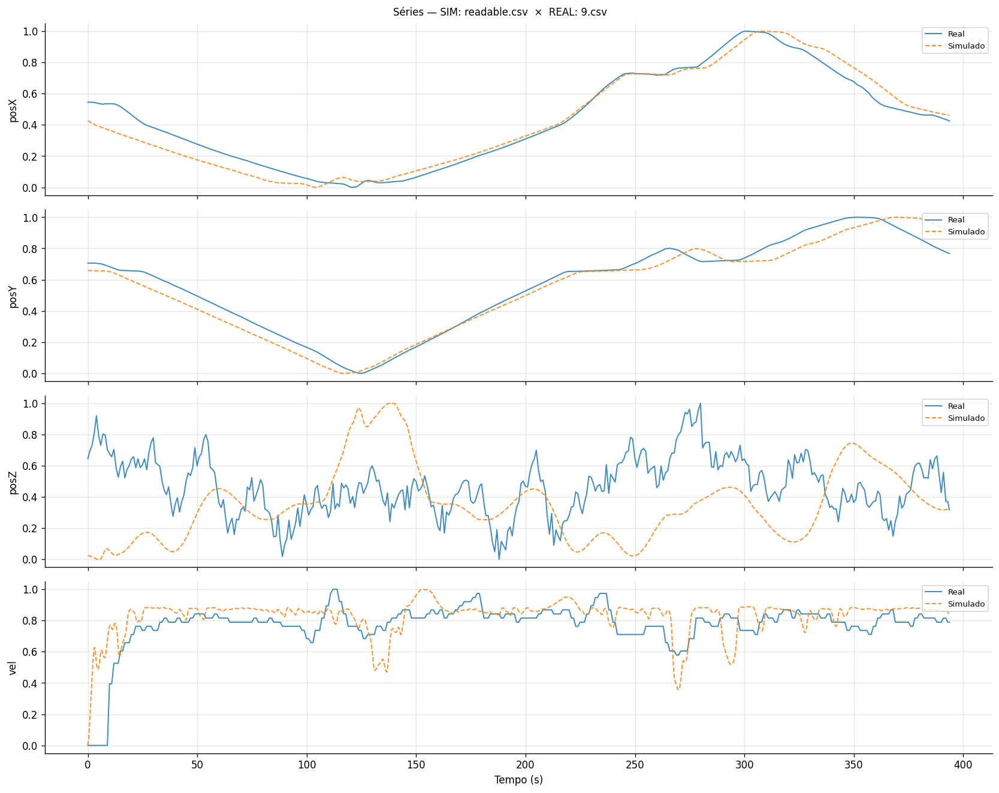

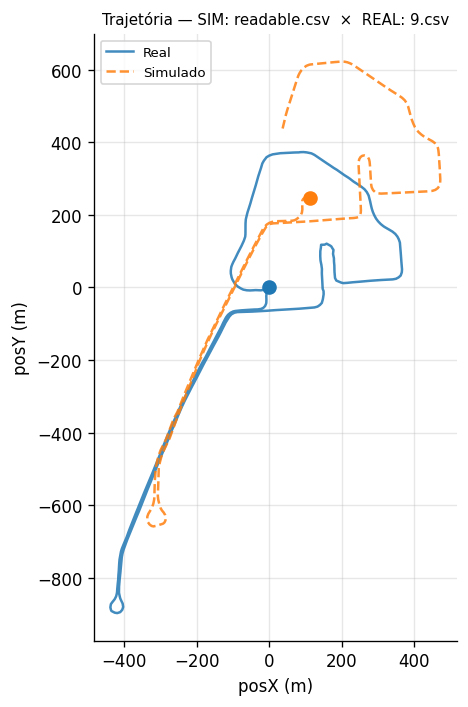

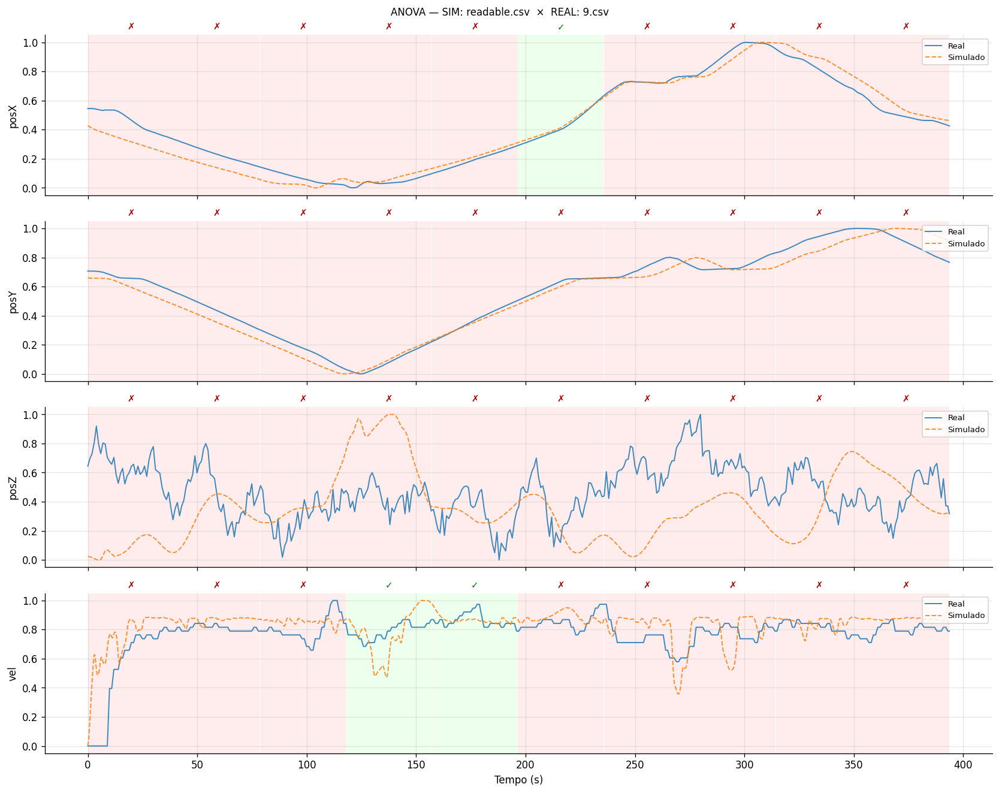

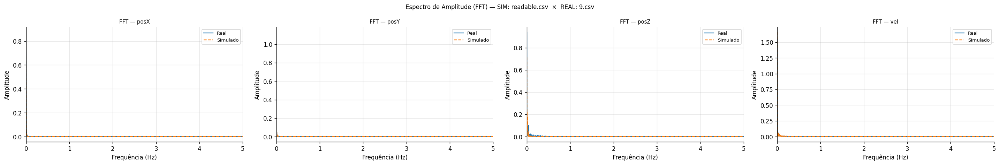

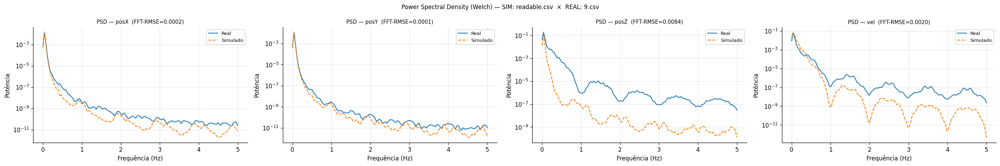

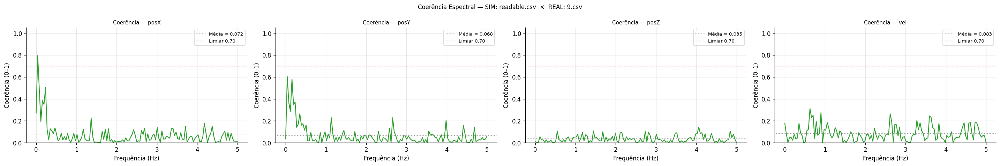

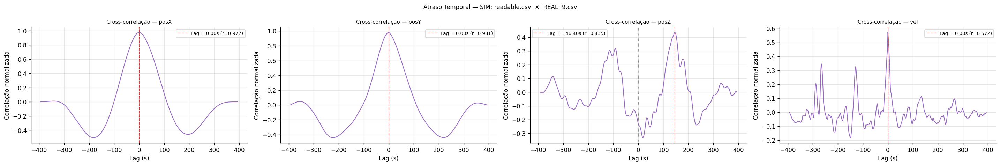

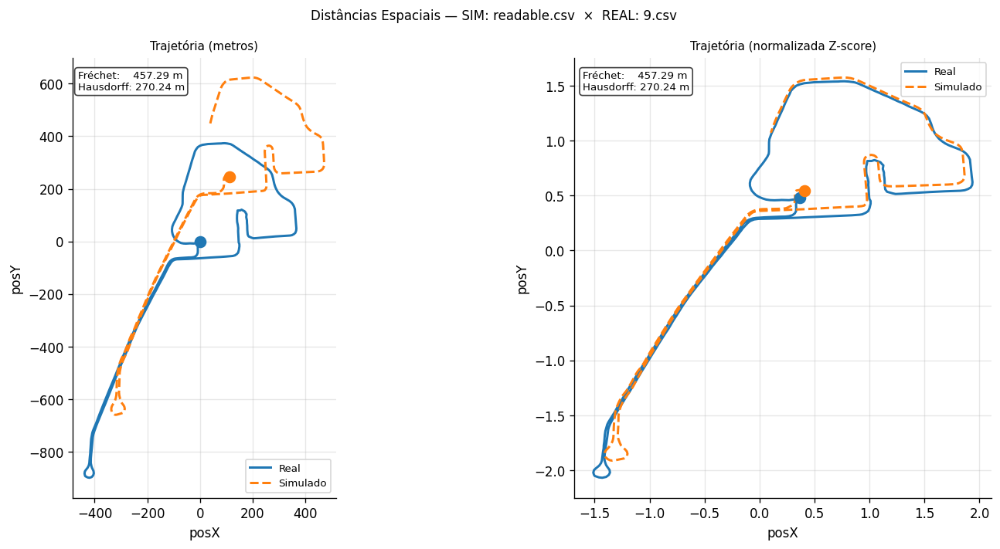

    Fréchet Distance  : 457.2913 m
    Hausdorff Distance: 270.2438 m

    Var     Pearson     DTW    RMSE     MAE   Lag(s)   Coer.   FFT-E   Score  Classificação
    ────────────────────────────────────────────────────────────────────────────────
    posX     0.9766  0.9996  0.0687  0.0535    0.000  0.0720  0.1631  0.7854  Boa
    posY     0.9805  0.9997  0.0636  0.0526    0.000  0.0680  0.1514  0.7873  Boa
    posZ    -0.2334  0.9968  0.3451  0.2889  146.400  0.0346  0.4974  0.4157  Baixa
    vel      0.5722  0.9993  0.1329  0.0963    0.000  0.0826  0.3168  0.6731  Moderada


Loop concluído!


In [12]:
# Armazena todos os resultados
# Estrutura: todos_resultados[nome_sim][nome_real] = {metricas, metricas_avancadas, ...}
todos_resultados = {}

for nome_sim, sim_prep in cache_sim.items():

    todos_resultados[nome_sim] = {}

    print('\n' + '█' * 70)
    print(f'SIMULADO: {nome_sim}')
    print('█' * 70)

    for nome_real, real_prep in cache_real.items():

        label = f'SIM: {nome_sim[:30]}  ×  REAL: {nome_real[:30]}'
        print(f'\n  ── {label}')

        # Colunas disponíveis em ambos
        colunas_ok = [c for c in COLUNAS_CORR
                      if c in real_prep.columns and c in sim_prep.columns]
        if not colunas_ok:
            print('    ERRO: nenhuma coluna comparável')
            continue

        # Alinhar e normalizar (MinMax — mantido para compatibilidade dos plots originais)
        try:
            df, lags, real_c, sim_c = alinhar_e_normalizar(real_prep, sim_prep, colunas_ok)
        except Exception as e:
            print(f'    ERRO no alinhamento: {e}')
            continue

        t = df.index.total_seconds().values
        n = len(df)
        print(f'    Amostras: {n} | Lags: { {k:v for k,v in lags.items() if k in colunas_ok} }')

        # ── Plot 1: Séries normalizadas ──────────────────────────────────────
        fig, axes = plt.subplots(len(colunas_ok), 1,
                                 figsize=(14, 2.8 * len(colunas_ok)), sharex=True)
        if len(colunas_ok) == 1:
            axes = [axes]
        for ax, col in zip(axes, colunas_ok):
            ax.plot(t, df[f'real_{col}'],        label='Real',     color='#1f77b4', lw=1.2, alpha=0.85)
            ax.plot(t, df[f'sim_{col}_shifted'], label='Simulado', color='#ff7f0e', lw=1.2, alpha=0.85, ls='--')
            ax.set_ylabel(col, fontsize=10)
            ax.set_ylim(-0.05, 1.05)
            ax.legend(loc='upper right', fontsize=8)
        axes[-1].set_xlabel('Tempo (s)')
        fig.suptitle(f'Séries — {label}', fontsize=10)
        plt.tight_layout(); plt.show()

        # ── Plot 2: Trajetória XY ────────────────────────────────────────────
        if 'posX' in colunas_ok and 'posY' in colunas_ok:
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.plot(real_c['posX'], real_c['posY'], label='Real',     color='#1f77b4', lw=1.5, alpha=0.85)
            ax.plot(sim_c['posX'],  sim_c['posY'],  label='Simulado', color='#ff7f0e', lw=1.5, alpha=0.85, ls='--')
            ax.scatter(real_c['posX'].iloc[0], real_c['posY'].iloc[0], color='#1f77b4', s=60, zorder=5)
            ax.scatter(sim_c['posX'].iloc[0],  sim_c['posY'].iloc[0],  color='#ff7f0e', s=60, zorder=5)
            ax.set_xlabel('posX (m)'); ax.set_ylabel('posY (m)')
            ax.set_title(f'Trajetória — {label}', fontsize=9)
            ax.legend(fontsize=8); ax.set_aspect('equal')
            plt.tight_layout(); plt.show()

        # ── Métricas originais (Pearson · DTW · ANOVA) ──────────────────────
        metricas = calcular_metricas(df, colunas_ok, N_SEGMENTOS)

        # ── Plot 3: ANOVA ────────────────────────────────────────────────────
        fig, axes = plt.subplots(len(colunas_ok), 1,
                                 figsize=(14, 2.8 * len(colunas_ok)), sharex=True)
        if len(colunas_ok) == 1:
            axes = [axes]
        for ax, col in zip(axes, colunas_ok):
            ax.plot(t, df[f'real_{col}'],        label='Real',     color='#1f77b4', lw=1.2, alpha=0.85)
            ax.plot(t, df[f'sim_{col}_shifted'], label='Simulado', color='#ff7f0e', lw=1.2, alpha=0.85, ls='--')
            for seg in metricas[col]['anova_segs']:
                cor = '#ffcccc' if seg['p'] < 0.05 else '#ccffcc'
                ax.axvspan(seg['ini'], seg['fim'], alpha=0.35, color=cor, lw=0)
                ax.text((seg['ini'] + seg['fim']) / 2, 1.02,
                        '✗' if seg['p'] < 0.05 else '✓',
                        ha='center', va='bottom', fontsize=9,
                        color='#aa0000' if seg['p'] < 0.05 else '#007700',
                        transform=ax.get_xaxis_transform())
            ax.set_ylabel(col, fontsize=10); ax.set_ylim(-0.05, 1.05)
            ax.legend(loc='upper right', fontsize=8)
        axes[-1].set_xlabel('Tempo (s)')
        fig.suptitle(f'ANOVA — {label}', fontsize=10)
        plt.tight_layout(); plt.show()

        # ════════════════════════════════════════════════════════════════════
        # MÉTRICAS AVANÇADAS (v8)
        # ════════════════════════════════════════════════════════════════════

        metricas_av = {}   # acumula por variável

        for col in colunas_ok:
            x_raw = df[f'real_{col}'].values
            y_raw = df[f'sim_{col}_shifted'].values

            if len(x_raw) < 8:
                continue

            # ── RMSE / MAE ───────────────────────────────────────────────
            rmse_val = calcular_rmse(x_raw, y_raw)
            mae_val  = calcular_mae(x_raw,  y_raw)

            # ── Atraso temporal ──────────────────────────────────────────
            lag_samp, lag_seg, corr_max, lags_s, corr_full = calcular_atraso(x_raw, y_raw)
            lag_norm = abs(lag_samp) / n

            # ── Coerência espectral ──────────────────────────────────────
            try:
                fc, coh = calcular_coerencia(x_raw, y_raw)
                coh_media = float(np.mean(coh))
            except Exception:
                fc, coh, coh_media = None, None, np.nan

            # ── FFT ──────────────────────────────────────────────────────
            fxr, Ar = calcular_fft(x_raw)
            fxs, As = calcular_fft(y_raw)

            # ── PSD ──────────────────────────────────────────────────────
            f_psd_r, p_psd_r = calcular_psd(x_raw)
            f_psd_s, p_psd_s = calcular_psd(y_raw)
            fft_rmse_val  = rmse_espectral(x_raw, y_raw)
            psd_std        = np.std(p_psd_r) + 1e-10
            fft_rmse_norm  = float(np.clip(fft_rmse_val / psd_std, 0, 1))

            metricas_av[col] = {
                'rmse': rmse_val, 'mae': mae_val,
                'lag_samp': lag_samp, 'lag_seg': lag_seg, 'corr_max': corr_max,
                'lag_norm': lag_norm, 'lags_s': lags_s, 'corr_full': corr_full,
                'coh_media': coh_media, 'fc': fc, 'coh': coh,
                'fxr': fxr, 'Ar': Ar, 'fxs': fxs, 'As': As,
                'f_psd_r': f_psd_r, 'p_psd_r': p_psd_r,
                'f_psd_s': f_psd_s, 'p_psd_s': p_psd_s,
                'fft_rmse': fft_rmse_val, 'fft_rmse_norm': fft_rmse_norm,
            }

        # ── Plot 4: FFT — espectro de amplitude ─────────────────────────────
        n_cols = len(metricas_av)
        if n_cols:
            fig, axes = plt.subplots(1, n_cols, figsize=(6 * n_cols, 4))
            if n_cols == 1: axes = [axes]
            for ax, col in zip(axes, metricas_av):
                m = metricas_av[col]
                ax.plot(m['fxr'], m['Ar'], label='Real',     color='#1f77b4', lw=1.4)
                ax.plot(m['fxs'], m['As'], label='Simulado', color='#ff7f0e', lw=1.4, ls='--')
                ax.set_title(f'FFT — {col}', fontsize=9)
                ax.set_xlabel('Frequência (Hz)'); ax.set_ylabel('Amplitude')
                ax.set_xlim(0, FS / 2); ax.legend(fontsize=8)
            fig.suptitle(f'Espectro de Amplitude (FFT) — {label}', fontsize=10)
            plt.tight_layout(); plt.show()

        # ── Plot 5: PSD — densidade de potência ─────────────────────────────
        if n_cols:
            fig, axes = plt.subplots(1, n_cols, figsize=(6 * n_cols, 4))
            if n_cols == 1: axes = [axes]
            for ax, col in zip(axes, metricas_av):
                m = metricas_av[col]
                ax.semilogy(m['f_psd_r'], m['p_psd_r'], label='Real',     color='#1f77b4', lw=1.4)
                ax.semilogy(m['f_psd_s'], m['p_psd_s'], label='Simulado', color='#ff7f0e', lw=1.4, ls='--')
                ax.set_title(f'PSD — {col}  (FFT-RMSE={m["fft_rmse"]:.4f})', fontsize=9)
                ax.set_xlabel('Frequência (Hz)'); ax.set_ylabel('Potência')
                ax.legend(fontsize=8)
            fig.suptitle(f'Power Spectral Density (Welch) — {label}', fontsize=10)
            plt.tight_layout(); plt.show()

        # ── Plot 6: Coerência espectral ──────────────────────────────────────
        cols_coh = [c for c in metricas_av if metricas_av[c]['fc'] is not None]
        if cols_coh:
            fig, axes = plt.subplots(1, len(cols_coh), figsize=(6 * len(cols_coh), 4))
            if len(cols_coh) == 1: axes = [axes]
            for ax, col in zip(axes, cols_coh):
                m = metricas_av[col]
                ax.plot(m['fc'], m['coh'], color='#2ca02c', lw=1.4)
                ax.axhline(m['coh_media'], color='gray',    ls=':',  lw=1,
                           label=f'Média = {m["coh_media"]:.3f}')
                ax.axhline(0.70,           color='#d62728', ls='--', lw=0.8,
                           label='Limiar 0.70')
                ax.set_ylim(0, 1.05)
                ax.set_title(f'Coerência — {col}', fontsize=9)
                ax.set_xlabel('Frequência (Hz)'); ax.set_ylabel('Coerência (0–1)')
                ax.legend(fontsize=8)
            fig.suptitle(f'Coerência Espectral — {label}', fontsize=10)
            plt.tight_layout(); plt.show()

        # ── Plot 7: Atraso temporal (cross-correlação) ───────────────────────
        if n_cols:
            fig, axes = plt.subplots(1, n_cols, figsize=(6 * n_cols, 4))
            if n_cols == 1: axes = [axes]
            for ax, col in zip(axes, metricas_av):
                m = metricas_av[col]
                ax.plot(m['lags_s'], m['corr_full'], color='#9467bd', lw=1.2)
                ax.axvline(m['lag_seg'], color='#d62728', ls='--', lw=1.2,
                           label=f'Lag = {m["lag_seg"]:.2f}s (r={m["corr_max"]:.3f})')
                ax.axvline(0, color='gray', ls=':', lw=0.8)
                ax.set_title(f'Cross-correlação — {col}', fontsize=9)
                ax.set_xlabel('Lag (s)'); ax.set_ylabel('Correlação normalizada')
                ax.legend(fontsize=8)
            fig.suptitle(f'Atraso Temporal — {label}', fontsize=10)
            plt.tight_layout(); plt.show()

        # ── Fréchet & Hausdorff (apenas para trajetória XY) ─────────────────
        frechet_val   = np.nan
        hausdorff_val = np.nan
        if 'posX' in colunas_ok and 'posY' in colunas_ok:
            try:
                n_xy = min(len(real_c), len(sim_c))
                hx = real_c['posX'].values[:n_xy]
                hy = real_c['posY'].values[:n_xy]
                sx = sim_c['posX'].values[:n_xy]
                sy = sim_c['posY'].values[:n_xy]
                frechet_val   = frechet_distance(hx, hy, sx, sy)
                hausdorff_val = hausdorff_distance(hx, hy, sx, sy)

                # ── Plot 8: trajetória anotada com distâncias ────────────
                fig, axes = plt.subplots(1, 2, figsize=(13, 6))
                for ax, titulo, usar_norm in zip(
                        axes,
                        ['Trajetória (metros)', 'Trajetória (normalizada Z-score)'],
                        [False, True]):
                    if usar_norm:
                        def zn(v): return (v - v.mean()) / (v.std() + 1e-10)
                        px, py, qx, qy = zn(hx), zn(hy), zn(sx), zn(sy)
                    else:
                        px, py, qx, qy = hx, hy, sx, sy
                    ax.plot(px, py, label='Real',     color='#1f77b4', lw=1.8)
                    ax.plot(qx, qy, label='Simulado', color='#ff7f0e', lw=1.8, ls='--')
                    ax.scatter([px[0]], [py[0]], color='#1f77b4', s=70, zorder=5)
                    ax.scatter([qx[0]], [qy[0]], color='#ff7f0e', s=70, zorder=5)
                    ax.set_xlabel('posX'); ax.set_ylabel('posY')
                    ax.set_aspect('equal'); ax.legend(fontsize=8)
                    ax.set_title(titulo, fontsize=9)
                    ax.annotate(
                        f'Fréchet:    {frechet_val:.2f} m\nHausdorff: {hausdorff_val:.2f} m',
                        xy=(0.02, 0.97), xycoords='axes fraction', va='top', fontsize=8,
                        bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.75))
                fig.suptitle(f'Distâncias Espaciais — {label}', fontsize=10)
                plt.tight_layout(); plt.show()
                print(f'    Fréchet Distance  : {frechet_val:.4f} m')
                print(f'    Hausdorff Distance: {hausdorff_val:.4f} m')
            except Exception as e:
                print(f'    AVISO Fréchet/Hausdorff: {e}')

        # ── Score híbrido por variável ───────────────────────────────────────
        scores = {}
        for col in colunas_ok:
            m_orig = metricas[col]
            m_av   = metricas_av.get(col, {})
            fr_norm = float(np.clip(frechet_val / (frechet_val + 1), 0, 1))                       if col in ('posX', 'posY') and not np.isnan(frechet_val) else 0.5
            scores[col] = score_hibrido(
                m_orig['pearson_r'],
                m_orig['dtw_sim'],
                min(m_av.get('rmse', 1), 1),
                m_av.get('coh_media', 0) if not np.isnan(m_av.get('coh_media', np.nan)) else 0,
                m_av.get('lag_norm', 0),
                m_av.get('fft_rmse_norm', 0),
                fr_norm,
            )

        # ── Tabela do par (todas as métricas) ────────────────────────────────
        print(f"\n    {'Var':<6} {'Pearson':>8} {'DTW':>7} {'RMSE':>7} {'MAE':>7} "
              f"{'Lag(s)':>8} {'Coer.':>7} {'FFT-E':>7} {'Score':>7}  Classificação")
        print('    ' + '─' * 80)
        for col in colunas_ok:
            m_o = metricas[col]
            m_a = metricas_av.get(col, {})
            sc  = scores.get(col, np.nan)
            print(f"    {col:<6} "
                  f"{m_o['pearson_r']:>8.4f} "
                  f"{m_o['dtw_sim']:>7.4f} "
                  f"{m_a.get('rmse', np.nan):>7.4f} "
                  f"{m_a.get('mae',  np.nan):>7.4f} "
                  f"{m_a.get('lag_seg', np.nan):>8.3f} "
                  f"{m_a.get('coh_media', np.nan):>7.4f} "
                  f"{m_a.get('fft_rmse_norm', np.nan):>7.4f} "
                  f"{sc:>7.4f}  {classificar_score(sc)}")

        # ── Guardar ──────────────────────────────────────────────────────────
        todos_resultados[nome_sim][nome_real] = {
            'colunas':          colunas_ok,
            'metricas':         metricas,
            'metricas_av':      metricas_av,
            'scores':           scores,
            'frechet':          frechet_val,
            'hausdorff':        hausdorff_val,
        }

print('\n\nLoop concluído!')


## 6. Comparativo final — heatmaps por métrica

Cada heatmap tem:
- **Linhas** = arquivos simulados
- **Colunas** = arquivos reais
- **Cor** = valor da métrica naquela combinação

Permite identificar visualmente qual simulado melhor representa qual real.

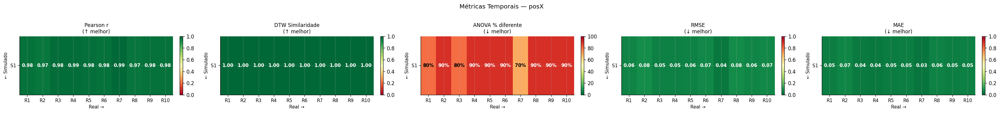

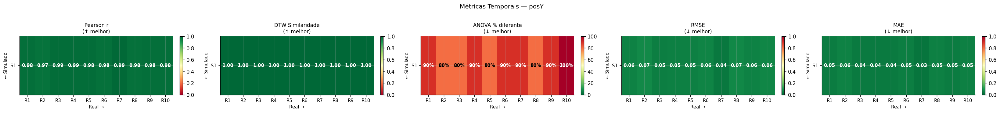

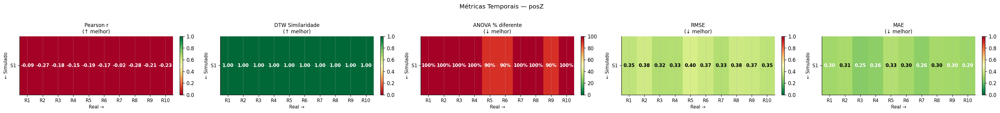

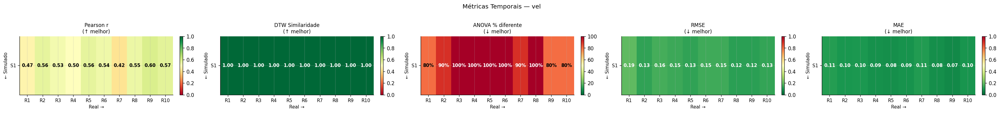

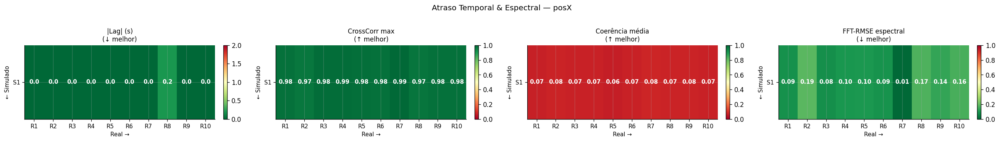

...

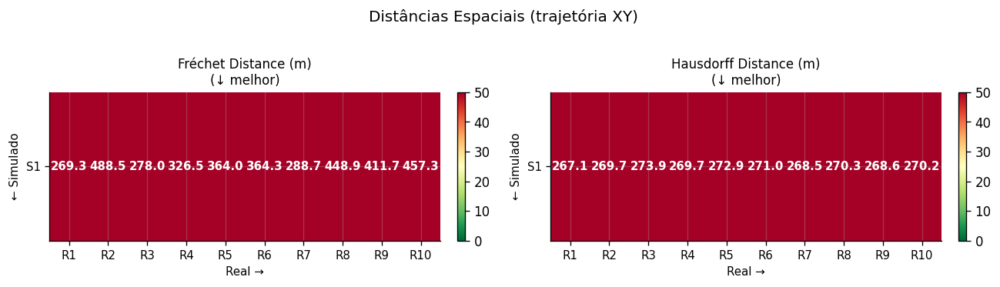

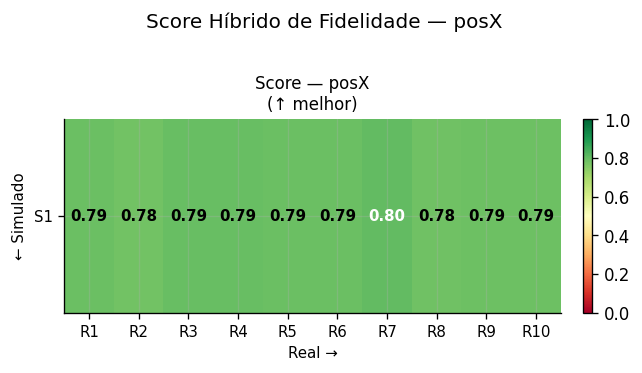

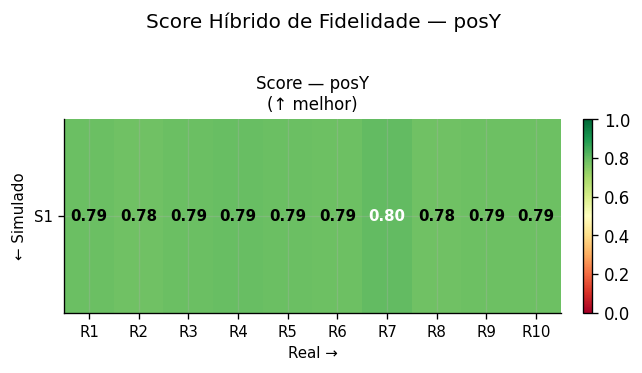

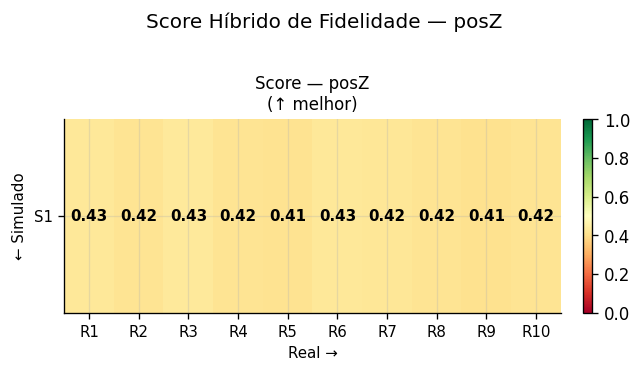

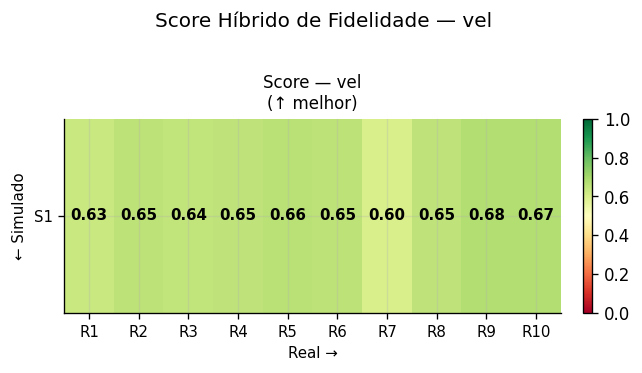

Legenda dos rótulos:
  R1 = 1.csv
  R2 = 10.csv
  R3 = 2.csv
  R4 = 3.csv
  R5 = 4.csv
  R6 = 5.csv
  R7 = 6.csv
  R8 = 7.csv
  R9 = 8.csv
  R10 = 9.csv
  S1 = readable.csv


In [13]:
nomes_sim  = list(cache_sim.keys())
nomes_real = list(cache_real.keys())
ns, nr     = len(nomes_sim), len(nomes_real)

if ns < 1 or nr < 1:
    print('Sem resultados para exibir.')
else:
    label_sim  = [f'S{i+1}' for i in range(ns)]
    label_real = [f'R{i+1}' for i in range(nr)]

    def montar_matriz(extractor):
        """extractor(res) -> float, onde res = todos_resultados[s][r]"""
        M = np.full((ns, nr), np.nan)
        for si, ns_ in enumerate(nomes_sim):
            for ri, nr_ in enumerate(nomes_real):
                try:
                    M[si, ri] = extractor(todos_resultados[ns_][nr_])
                except Exception:
                    pass
        return M

    def heatmap_grupo(titulo_grupo, configs, col=None):
        """
        configs: lista de (titulo, extractor_fn, cmap, vmin, vmax, maior_melhor)
        col: nome da variável (para métricas por coluna) ou None
        """
        nc = len(configs)
        fig, axes = plt.subplots(1, nc, figsize=(5.5 * nc, max(3, ns * 0.7 + 2)))
        if nc == 1: axes = [axes]
        for ax, (titulo, extractor, cmap, vmin, vmax, maior_melhor) in zip(axes, configs):
            M = montar_matriz(extractor)
            im = ax.imshow(M, cmap=cmap, vmin=vmin, vmax=vmax, aspect='auto')
            for si in range(ns):
                for ri in range(nr):
                    val = M[si, ri]
                    if not np.isnan(val):
                        fmt = f'{val:.2f}' if vmax <= 1.01 else (f'{val:.0f}%' if vmax == 100 else f'{val:.1f}')
                        nv  = (val - vmin) / (vmax - vmin + 1e-10)
                        cor = 'black' if 0.3 < nv < 0.8 else 'white'
                        ax.text(ri, si, fmt, ha='center', va='center',
                                fontsize=9, color=cor, fontweight='bold')
            ax.set_xticks(range(nr)); ax.set_xticklabels(label_real, fontsize=9)
            ax.set_yticks(range(ns)); ax.set_yticklabels(label_sim,  fontsize=9)
            ax.set_xlabel('Real →', fontsize=9); ax.set_ylabel('← Simulado', fontsize=9)
            nota = '↑ melhor' if maior_melhor else '↓ melhor'
            ax.set_title(f'{titulo}\n({nota})', fontsize=10)
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        suf = f' — {col}' if col else ''
        fig.suptitle(f'{titulo_grupo}{suf}', fontsize=12, y=1.02)
        plt.tight_layout(); plt.show()

    # ── Heatmaps por variável: métricas temporais ────────────────────────────
    for col in COLUNAS_CORR:
        heatmap_grupo('Métricas Temporais', [
            ('Pearson r',
             lambda r, c=col: r['metricas'][c]['pearson_r'],
             'RdYlGn', 0, 1, True),
            ('DTW Similaridade',
             lambda r, c=col: r['metricas'][c]['dtw_sim'],
             'RdYlGn', 0, 1, True),
            ('ANOVA % diferente',
             lambda r, c=col: r['metricas'][c]['anova_pct_dif'],
             'RdYlGn_r', 0, 100, False),
            ('RMSE',
             lambda r, c=col: r['metricas_av'][c]['rmse'],
             'RdYlGn_r', 0, 1, False),
            ('MAE',
             lambda r, c=col: r['metricas_av'][c]['mae'],
             'RdYlGn_r', 0, 1, False),
        ], col=col)

    # ── Heatmaps por variável: atraso temporal e espectral ───────────────────
    for col in COLUNAS_CORR:
        heatmap_grupo('Atraso Temporal & Espectral', [
            ('|Lag| (s)',
             lambda r, c=col: abs(r['metricas_av'][c]['lag_seg']),
             'RdYlGn_r', 0, 2, False),
            ('CrossCorr max',
             lambda r, c=col: r['metricas_av'][c]['corr_max'],
             'RdYlGn', 0, 1, True),
            ('Coerência média',
             lambda r, c=col: r['metricas_av'][c]['coh_media'],
             'RdYlGn', 0, 1, True),
            ('FFT-RMSE espectral',
             lambda r, c=col: r['metricas_av'][c]['fft_rmse_norm'],
             'RdYlGn_r', 0, 1, False),
        ], col=col)

    # ── Heatmap espacial: Fréchet & Hausdorff (único por par, não por variável)
    heatmap_grupo('Distâncias Espaciais (trajetória XY)', [
        ('Fréchet Distance (m)',
         lambda r: r['frechet'],
         'RdYlGn_r', 0, 50, False),
        ('Hausdorff Distance (m)',
         lambda r: r['hausdorff'],
         'RdYlGn_r', 0, 50, False),
    ])

    # ── Heatmap de Score Híbrido ─────────────────────────────────────────────
    for col in COLUNAS_CORR:
        heatmap_grupo('Score Híbrido de Fidelidade', [
            (f'Score — {col}',
             lambda r, c=col: r['scores'][c],
             'RdYlGn', 0, 1, True),
        ], col=col)

    # ── Legenda dos rótulos ──────────────────────────────────────────────────
    print('Legenda dos rótulos:')
    for i, f in enumerate(nomes_real):  print(f'  R{i+1} = {f}')
    for i, f in enumerate(nomes_sim):   print(f'  S{i+1} = {f}')


## 7. Tabela final consolidada
Todas as combinações em uma tabela única, ordenada por Pearson r decrescente.

In [14]:
linhas = []
for nome_sim in nomes_sim:
    for nome_real in nomes_real:
        try:
            res = todos_resultados[nome_sim][nome_real]
        except KeyError:
            continue
        for col in res['colunas']:
            m_o = res['metricas'][col]
            m_a = res['metricas_av'].get(col, {})
            sc  = res['scores'].get(col, np.nan)
            linhas.append({
                'Simulado':        nome_sim,
                'Real':            nome_real,
                'Variável':        col,
                'Pearson r':       round(m_o['pearson_r'],               4),
                'DTW sim':         round(m_o['dtw_sim'],                  4),
                'ANOVA dif%':      round(m_o['anova_pct_dif'],            1),
                'RMSE':            round(m_a.get('rmse',       np.nan),   4),
                'MAE':             round(m_a.get('mae',        np.nan),   4),
                'Lag (s)':         round(m_a.get('lag_seg',    np.nan),   3),
                'CrossCorr max':   round(m_a.get('corr_max',   np.nan),   4),
                'Coerência':       round(m_a.get('coh_media',  np.nan),   4),
                'FFT-RMSE':        round(m_a.get('fft_rmse_norm', np.nan),4),
                'Fréchet (m)':     round(res['frechet'],                  4),
                'Hausdorff (m)':   round(res['hausdorff'],                4),
                'Score':           round(sc,                              4),
                'Classificação':   classificar_score(sc),
                'Veredicto':       veredicto(m_o['pearson_r'],
                                             m_o['dtw_sim'],
                                             m_o['anova_pct_dif']),
            })

tabela = pd.DataFrame(linhas)
tabela = tabela.sort_values(['Variável', 'Score'], ascending=[True, False])

print('=== TABELA FINAL CONSOLIDADA — Digital Twin Fidelity (v8) ===\n')
display(tabela.reset_index(drop=True))
print(f'\nTotal de combinações: {len(tabela)}')

# ── Resumo médio por variável ────────────────────────────────────────────────
print('\n=== RESUMO MÉDIO POR VARIÁVEL ===')
cols_num = ['Pearson r','DTW sim','RMSE','MAE','Coerência','FFT-RMSE','Score']
resumo = tabela.groupby('Variável')[cols_num].mean().round(4)
resumo['Classificação'] = resumo['Score'].apply(classificar_score)
display(resumo)


=== TABELA FINAL CONSOLIDADA — Digital Twin Fidelity (v8) ===



,Simulado,Real,Variável,Pearson r,DTW sim,ANOVA dif%,RMSE,MAE,Lag (s),CrossCorr max,Coerência,FFT-RMSE,Fréchet (m),Hausdorff (m),Score,Classificação,Veredicto
0,readable.csv,6.csv,posX,0.9936,0.9999,70.0,0.0367,0.0285,0.0,0.9936,0.0791,0.0056,288.6547,268.5311,0.8043,Boa,✗ Divergente
1,readable.csv,3.csv,posX,0.9861,0.9999,90.0,0.0514,0.0388,0.0,0.9861,0.0731,0.0995,326.5037,269.6610,0.7942,Boa,✗ Divergente
2,readable.csv,2.csv,posX,0.9845,0.9999,80.0,0.0537,0.0408,0.0,0.9845,0.0704,0.0830,278.0171,273.9398,0.7938,Boa,✗ Divergente
3,readable.csv,1.csv,posX,0.9793,0.9998,80.0,0.0611,0.0483,0.0,0.9793,0.0701,0.0885,269.2921,267.0634,0.7909,Boa,✗ Divergente
4,readable.csv,4.csv,posX,0.9824,0.9999,90.0,0.0576,0.0454,0.0,0.9824,0.0649,0.1033,364.0464,272.9416,0.7908,Boa,✗ Divergente
5,readable.csv,5.csv,posX,0.9768,0.9999,90.0,0.0669,0.0506,0.0,0.9768,0.0726,0.0922,364.2813,271.0055,0.7894,Boa,✗ Divergente
6,readable.csv,8.csv,posX,0.9785,0.9998,90.0,0.0641,0.0506,0.0,0.9785,0.0752,0.1360,411.6505,268.5857,0.7885,Boa,✗ Divergente
7,readable.csv,9.csv,posX,0.9766,0.9996,90.0,0.0687,0.0535,0.0,0.9766,0.0720,0.1631,457.2913,270.2438,0.7854,Boa,✗ Divergente
8,readable.csv,7.csv,posX,0.9718,0.9996,90.0,0.0751,0.0573,0.2,0.9718,0.0745,0.1682,448.8613,270.3367,0.7830,Boa,✗ Divergente
9,readable.csv,10.csv,posX,0.9660,0.9996,90.0,0.0820,0.0662,0.0,0.9660,0.0766,0.1866,488.4809,269.6818,0.7797,Boa,✗ Divergente



Total de combinações: 40

=== RESUMO MÉDIO POR VARIÁVEL ===


,Pearson r,DTW sim,RMSE,MAE,Coerência,FFT-RMSE,Score,Classificação
Variável,,,,,,,,
posX,0.9796,0.9998,0.0617,0.0480,0.0728,0.1126,0.7900,Boa
posY,0.9825,0.9998,0.0571,0.0456,0.0690,0.1429,0.7895,Boa
posZ,-0.1776,0.9968,0.3567,0.2900,0.0359,0.4015,0.4197,Baixa
vel,0.5300,0.9992,0.1445,0.0937,0.0615,0.4495,0.6489,Moderada
